# Wasserstein GAN with Gradient Penalty (WGAN-GP)

### Goals
In this notebook, you're going to build a Wasserstein GAN with Gradient Penalty (WGAN-GP) that solves some of the stability issues with the GANs that you have been using up until this point. Specifically, you'll use a special kind of loss function known as the W-loss, where W stands for Wasserstein, and gradient penalties to prevent mode collapse.

*Fun Fact: Wasserstein is named after a mathematician at Penn State, Leonid Vaseršteĭn. You'll see it abbreviated to W (e.g. WGAN, W-loss, W-distance).*

### Learning Objectives
1.   Get hands-on experience building a more stable GAN: Wasserstein GAN with Gradient Penalty (WGAN-GP).
2.   Train the more advanced WGAN-GP model.



## Generator and Critic

You will begin by importing some useful packages, defining visualization functions, building the generator, and building the critic. Since the changes for WGAN-GP are done to the loss function during training, you can simply reuse your previous GAN code for the generator and critic class. Remember that in WGAN-GP, you no longer use a discriminator that classifies fake and real as 0 and 1 but rather a critic that scores images with real numbers.

#### Packages and Visualizations

In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in an uniform grid.
    '''
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

def make_grad_hook():
    '''
    Function to keep track of gradients for visualization purposes, 
    which fills the grads list when using model.apply(grad_hook).
    '''
    grads = []
    def grad_hook(m):
        if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
            grads.append(m.weight.grad)
    return grads, grad_hook

#### Generator and Noise

In [2]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_chan: the number of channels in the images, fitted for the dataset used, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_chan=1, hidden_dim=64):
        super(Generator, self).__init__()
        self.z_dim = z_dim
        # Build the neural network
        self.gen = nn.Sequential(
            self.make_gen_block(z_dim, hidden_dim * 4),
            self.make_gen_block(hidden_dim * 4, hidden_dim * 2, kernel_size=4, stride=1),
            self.make_gen_block(hidden_dim * 2, hidden_dim),
            self.make_gen_block(hidden_dim, im_chan, kernel_size=4, final_layer=True),
        )

    def make_gen_block(self, input_channels, output_channels, kernel_size=3, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a generator block of DCGAN;
        a transposed convolution, a batchnorm (except in the final layer), and an activation.
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.ReLU(inplace=True),
            )
        else:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.Tanh(),
            )

    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor,
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        x = noise.view(len(noise), self.z_dim, 1, 1)
        return self.gen(x)

def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim)
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
      n_samples: the number of samples to generate, a scalar
      z_dim: the dimension of the noise vector, a scalar
      device: the device type
    '''
    return torch.randn(n_samples, z_dim, device=device)

#### Critic

In [3]:
class Critic(nn.Module):
    '''
    Critic Class
    Values:
        im_chan: the number of channels in the images, fitted for the dataset used, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_chan=1, hidden_dim=64):
        super(Critic, self).__init__()
        self.crit = nn.Sequential(
            self.make_crit_block(im_chan, hidden_dim),
            self.make_crit_block(hidden_dim, hidden_dim * 2),
            self.make_crit_block(hidden_dim * 2, 1, final_layer=True),
        )

    def make_crit_block(self, input_channels, output_channels, kernel_size=4, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a critic block of DCGAN;
        a convolution, a batchnorm (except in the final layer), and an activation (except in the final layer).
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.LeakyReLU(0.2, inplace=True),
            )
        else:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
            )

    def forward(self, image):
        '''
        Function for completing a forward pass of the critic: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_chan)
        '''
        crit_pred = self.crit(image)
        return crit_pred.view(len(crit_pred), -1)

## Training Initializations
Now you can start putting it all together.
As usual, you will start by setting the parameters:
  *   n_epochs: the number of times you iterate through the entire dataset when training
  *   z_dim: the dimension of the noise vector
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   beta_1, beta_2: the momentum terms
  *   c_lambda: weight of the gradient penalty
  *   crit_repeats: number of times to update the critic per generator update - there are more details about this in the *Putting It All Together* section
  *   device: the device type

You will also load and transform the MNIST dataset to tensors.




In [4]:
n_epochs = 100
z_dim = 64
display_step = 50
batch_size = 128
lr = 0.0002
beta_1 = 0.5
beta_2 = 0.999
c_lambda = 10
crit_repeats = 5
device = 'cuda'

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)),
])

dataloader = DataLoader(
    MNIST('.', download=False, transform=transform),
    batch_size=batch_size,
    shuffle=True)

Then, you can initialize your generator, critic, and optimizers.

In [5]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr, betas=(beta_1, beta_2))
crit = Critic().to(device) 
crit_opt = torch.optim.Adam(crit.parameters(), lr=lr, betas=(beta_1, beta_2))

def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)
gen = gen.apply(weights_init)
crit = crit.apply(weights_init)


## Gradient Penalty
Calculating the gradient penalty can be broken into two functions: (1) compute the gradient with respect to the images and (2) compute the gradient penalty given the gradient.

You can start by getting the gradient. The gradient is computed by first creating a mixed image. This is done by weighing the fake and real image using epsilon and then adding them together. Once you have the intermediate image, you can get the critic's output on the image. Finally, you compute the gradient of the critic score's on the mixed images (output) with respect to the pixels of the mixed images (input). You will need to fill in the code to get the gradient wherever you see *None*. There is a test function in the next block for you to test your solution.

In [6]:
# UNQ_C1 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gradient
def get_gradient(crit, real, fake, epsilon):
    '''
    Return the gradient of the critic's scores with respect to mixes of real and fake images.
    Parameters:
        crit: the critic model
        real: a batch of real images
        fake: a batch of fake images
        epsilon: a vector of the uniformly random proportions of real/fake per mixed image
    Returns:
        gradient: the gradient of the critic's scores, with respect to the mixed image
    '''
    # Mix the images together
    mixed_images = real * epsilon + fake * (1 - epsilon)

    # Calculate the critic's scores on the mixed images
    mixed_scores = crit(mixed_images)
    
    # Take the gradient of the scores with respect to the images
    gradient = torch.autograd.grad(
        # Note: You need to take the gradient of outputs with respect to inputs.
        # This documentation may be useful, but it should not be necessary:
        # https://pytorch.org/docs/stable/autograd.html#torch.autograd.grad
        #### START CODE HERE ####
        inputs=mixed_images,
        outputs=mixed_scores,
        #### END CODE HERE ####
        # These other parameters have to do with the pytorch autograd engine works
        grad_outputs=torch.ones_like(mixed_scores), 
        create_graph=True,
        retain_graph=True,
    )[0]
    return gradient


In [7]:
# UNIT TEST
# DO NOT MODIFY THIS
def test_get_gradient(image_shape):
    real = torch.randn(*image_shape, device=device) + 1
    fake = torch.randn(*image_shape, device=device) - 1
    epsilon_shape = [1 for _ in image_shape]
    epsilon_shape[0] = image_shape[0]
    epsilon = torch.rand(epsilon_shape, device=device).requires_grad_()
    gradient = get_gradient(crit, real, fake, epsilon)
    assert tuple(gradient.shape) == image_shape
    assert gradient.max() > 0
    assert gradient.min() < 0
    return gradient

gradient = test_get_gradient((256, 1, 28, 28))
print("Success!")

Success!


The second function you need to complete is to compute the gradient penalty given the gradient. First, you calculate the magnitude of each image's gradient. The magnitude of a gradient is also called the norm. Then, you calculate the penalty by squaring the distance between each magnitude and the ideal norm of 1 and taking the mean of all the squared distances.

Again, you will need to fill in the code wherever you see *None*. There are hints below that you can view if you need help and there is a test function in the next block for you to test your solution.

<details>

<summary>
<font size="3" color="green">
<b>Optional hints for <code><font size="4">gradient_penalty</font></code></b>
</font>
</summary>


1.   Make sure you take the mean at the end.
2.   Note that the magnitude of each gradient has already been calculated for you.

</details>


In [12]:
# UNQ_C2 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: gradient_penalty
def gradient_penalty(gradient):
    '''
    Return the gradient penalty, given a gradient.
    Given a batch of image gradients, you calculate the magnitude of each image's gradient
    and penalize the mean quadratic distance of each magnitude to 1.
    Parameters:
        gradient: the gradient of the critic's scores, with respect to the mixed image
    Returns:
        penalty: the gradient penalty
    '''
    # Flatten the gradients so that each row captures one image
    gradient = gradient.view(len(gradient), -1)

    # Calculate the magnitude of every row
    gradient_norm = gradient.norm(2, dim=1)
    
    # Penalize the mean squared distance of the gradient norms from 1
    #### START CODE HERE ####
    penalty = torch.mean((gradient_norm - torch.ones_like(gradient_norm))**2)
    #### END CODE HERE ####
    return penalty

In [13]:
# UNIT TEST
def test_gradient_penalty(image_shape):
    bad_gradient = torch.zeros(*image_shape)
    bad_gradient_penalty = gradient_penalty(bad_gradient)
    assert torch.isclose(bad_gradient_penalty, torch.tensor(1.))

    image_size = torch.prod(torch.Tensor(image_shape[1:]))
    good_gradient = torch.ones(*image_shape) / torch.sqrt(image_size)
    good_gradient_penalty = gradient_penalty(good_gradient)
    assert torch.isclose(good_gradient_penalty, torch.tensor(0.))

    random_gradient = test_get_gradient(image_shape)
    random_gradient_penalty = gradient_penalty(random_gradient)
    assert torch.abs(random_gradient_penalty - 1) < 0.1

test_gradient_penalty((256, 1, 28, 28))
print("Success!")

Success!


## Losses
Next, you need to calculate the loss for the generator and the critic.

For the generator, the loss is calculated by maximizing the critic's prediction on the generator's fake images. The argument has the scores for all fake images in the batch, but you will use the mean of them.

There are optional hints below and a test function in the next block for you to test your solution.

<details><summary><font size="3" color="green"><b>Optional hints for <code><font size="4">get_gen_loss</font></code></b></font></summary>

1. This can be written in one line.
2. This is the negative of the mean of the critic's scores.

</details>

In [14]:
# UNQ_C3 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gen_loss
def get_gen_loss(crit_fake_pred):
    '''
    Return the loss of a generator given the critic's scores of the generator's fake images.
    Parameters:
        crit_fake_pred: the critic's scores of the fake images
    Returns:
        gen_loss: a scalar loss value for the current batch of the generator
    '''
    #### START CODE HERE ####
    gen_loss = -torch.mean(crit_fake_pred)
    #### END CODE HERE ####
    return gen_loss

In [15]:
# UNIT TEST
assert torch.isclose(
    get_gen_loss(torch.tensor(1.)), torch.tensor(-1.0)
)

assert torch.isclose(
    get_gen_loss(torch.rand(10000)), torch.tensor(-0.5), 0.05
)

print("Success!")

Success!


For the critic, the loss is calculated by maximizing the distance between the critic's predictions on the real images and the predictions on the fake images while also adding a gradient penalty. The gradient penalty is weighed according to lambda. The arguments are the scores for all the images in the batch, and you will use the mean of them.

There are hints below if you get stuck and a test function in the next block for you to test your solution.

<details><summary><font size="3" color="green"><b>Optional hints for <code><font size="4">get_crit_loss</font></code></b></font></summary>

1. The higher the mean fake score, the higher the critic's loss is.
2. What does this suggest about the mean real score?
3. The higher the gradient penalty, the higher the critic's loss is, proportional to lambda.


</details>


In [16]:
# UNQ_C4 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_crit_loss
def get_crit_loss(crit_fake_pred, crit_real_pred, gp, c_lambda):
    '''
    Return the loss of a critic given the critic's scores for fake and real images,
    the gradient penalty, and gradient penalty weight.
    Parameters:
        crit_fake_pred: the critic's scores of the fake images
        crit_real_pred: the critic's scores of the real images
        gp: the unweighted gradient penalty
        c_lambda: the current weight of the gradient penalty 
    Returns:
        crit_loss: a scalar for the critic's loss, accounting for the relevant factors
    '''
    #### START CODE HERE ####
    crit_loss = torch.mean(crit_fake_pred)-torch.mean(crit_real_pred)+gp*c_lambda
    #### END CODE HERE ####
    return crit_loss

In [17]:
# UNIT TEST
assert torch.isclose(
    get_crit_loss(torch.tensor(1.), torch.tensor(2.), torch.tensor(3.), 0.1),
    torch.tensor(-0.7)
)
assert torch.isclose(
    get_crit_loss(torch.tensor(20.), torch.tensor(-20.), torch.tensor(2.), 10),
    torch.tensor(60.)
)

print("Success!")

Success!


## Putting It All Together
Before you put everything together, there are a few things to note.
1.   Even on GPU, the **training will run more slowly** than previous labs because the gradient penalty requires you to compute the gradient of a gradient -- this means potentially a few minutes per epoch! For best results, run this for as long as you can while on GPU.
2.   One important difference from earlier versions is that you will **update the critic multiple times** every time you update the generator This helps prevent the generator from overpowering the critic. Sometimes, you might see the reverse, with the generator updated more times than the critic. This depends on architectural (e.g. the depth and width of the network) and algorithmic choices (e.g. which loss you're using). 
3.   WGAN-GP isn't necessarily meant to improve overall performance of a GAN, but just **increases stability** and avoids mode collapse. In general, a WGAN will be able to train in a much more stable way than the vanilla DCGAN from last assignment, though it will generally run a bit slower. You should also be able to train your model for more epochs without it collapsing.


<!-- Once again, be warned that this runs very slowly on a CPU. One way to run this more quickly is to download the .ipynb and upload it to Google Drive, then open it with Google Colab and make the runtime type GPU and replace
`device = "cpu"`
with
`device = "cuda"`
and make sure that your `get_noise` function uses the right device.  -->

Here is a snapshot of what your WGAN-GP outputs should resemble:
![MNIST Digits Progression](MNIST_WGAN_Progression.png)

Step 50: Generator loss: -0.09519998963456601, critic loss: 1.9152995911985633


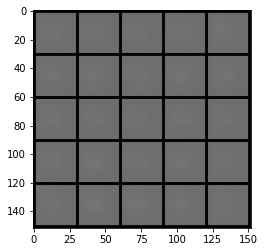

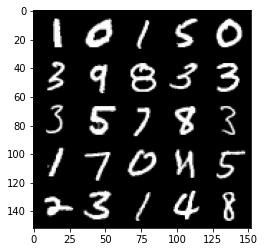

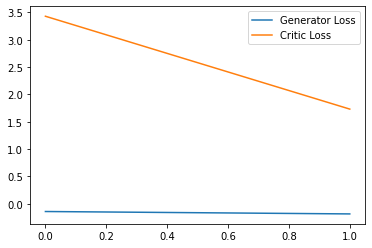

Step 100: Generator loss: 0.6983613330125809, critic loss: -1.6114481264948848


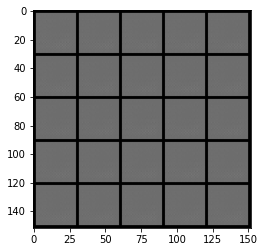

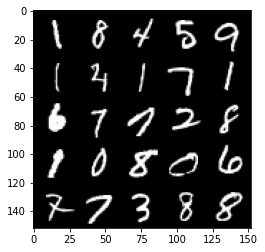

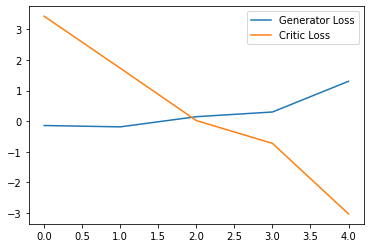

Step 150: Generator loss: 3.1603980660438538, critic loss: -10.230127285003661


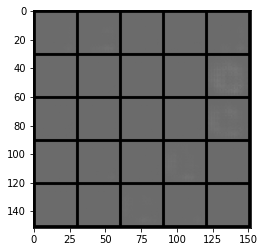

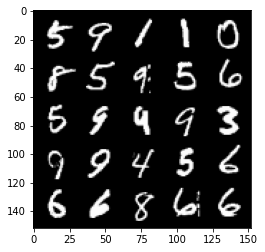

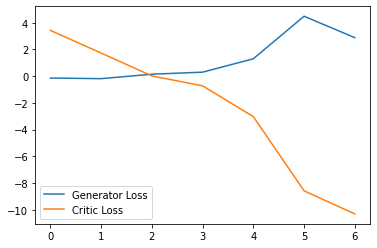

Step 200: Generator loss: -0.08299192182719707, critic loss: -23.79123730850219


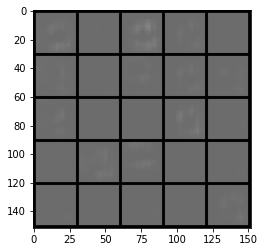

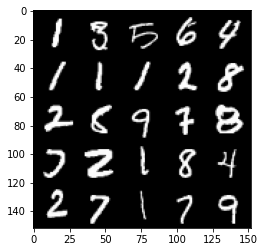

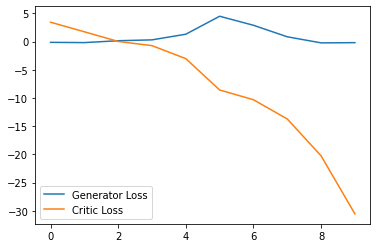

Step 250: Generator loss: -0.5757296409457922, critic loss: -54.50696403503418


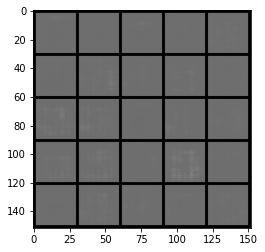

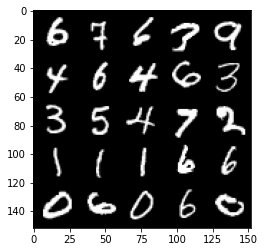

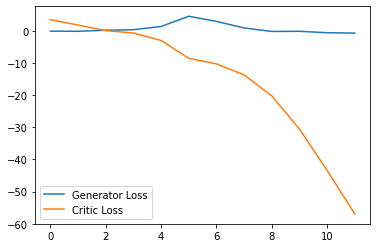

Step 300: Generator loss: 1.33799675822258, critic loss: -93.77278475952151


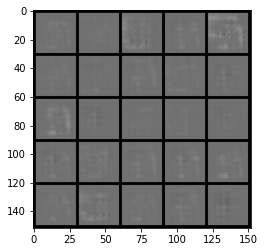

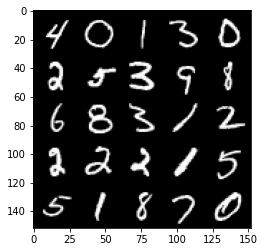

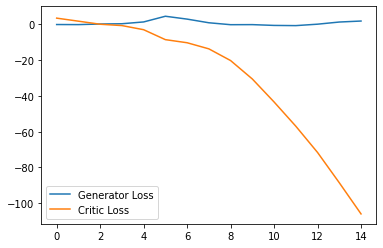

Step 350: Generator loss: 6.769746103286743, critic loss: -143.76188876342775


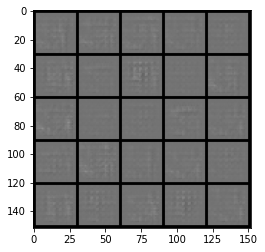

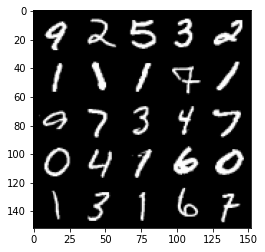

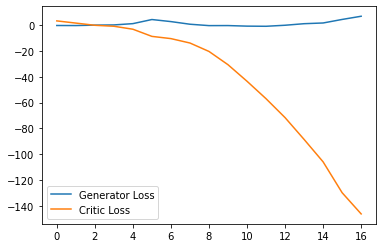

Step 400: Generator loss: 14.706696739196778, critic loss: -198.83063165283198


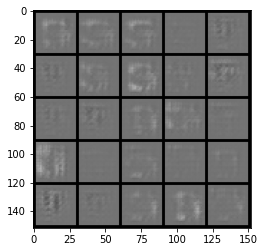

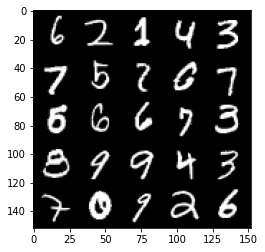

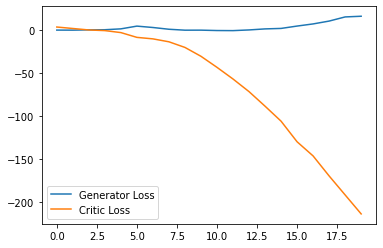

Step 450: Generator loss: 15.173977806568146, critic loss: -243.45404440307615


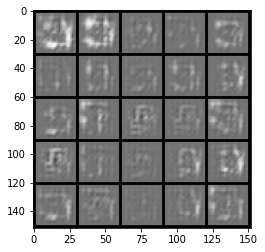

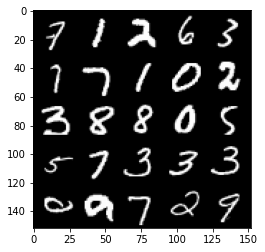

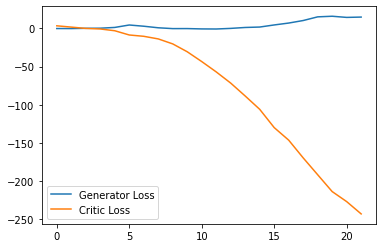

Step 500: Generator loss: -11.833393907546997, critic loss: -217.88396519470214


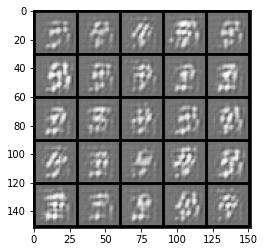

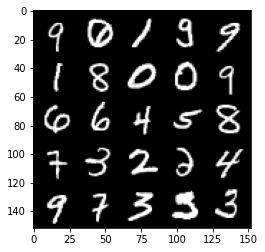

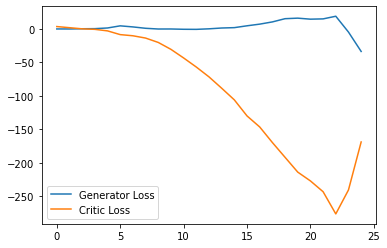

Step 550: Generator loss: 11.008114984035492, critic loss: -211.69990969848638


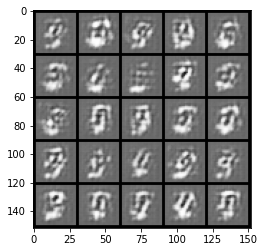

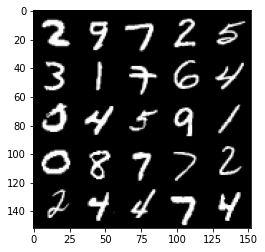

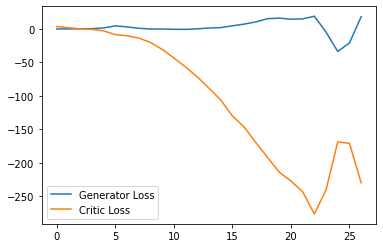

Step 600: Generator loss: 24.455617899894715, critic loss: -298.68082604980475


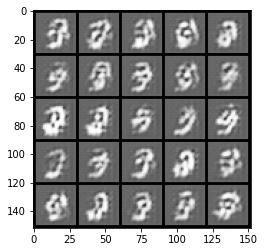

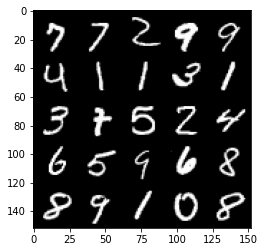

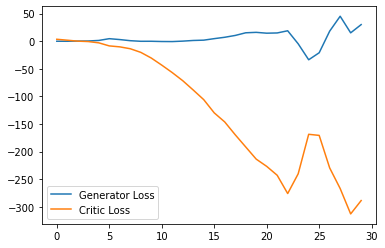

Step 650: Generator loss: 32.226428241729735, critic loss: -323.19046582031257


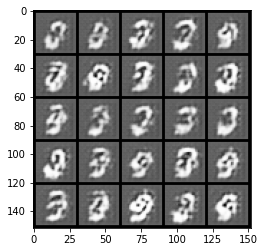

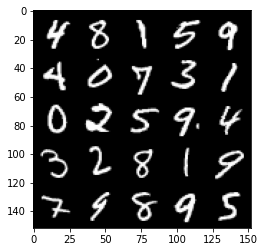

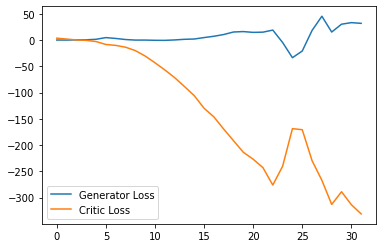

Step 700: Generator loss: 5.370037431716919, critic loss: -274.2475566711426


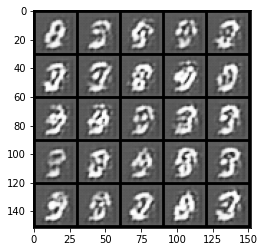

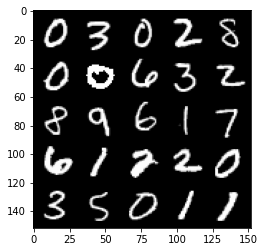

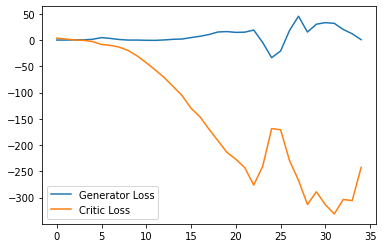

Step 750: Generator loss: 5.301134757995605, critic loss: -239.18595236206056


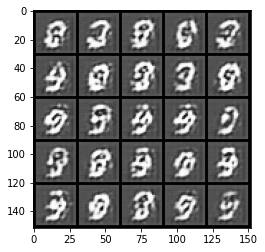

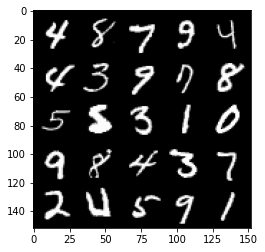

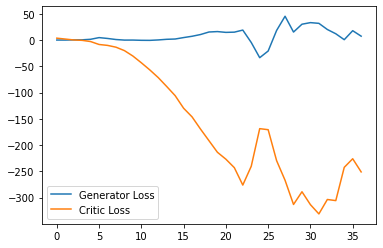

Step 800: Generator loss: -21.412292778491974, critic loss: -134.61194261169433


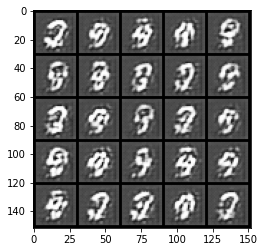

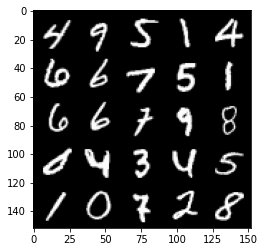

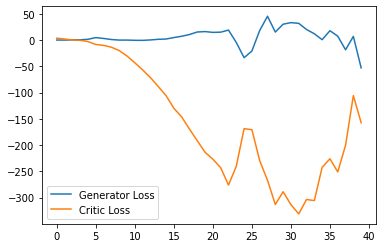

Step 850: Generator loss: -42.095659906864164, critic loss: -153.37032986450194


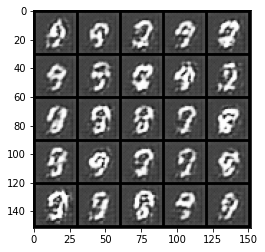

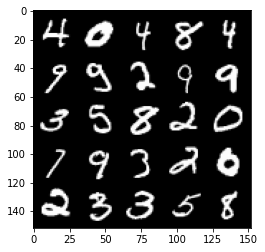

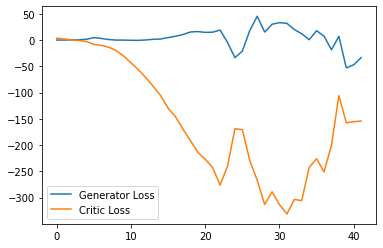

Step 900: Generator loss: -17.115829014778136, critic loss: -111.79162964630126


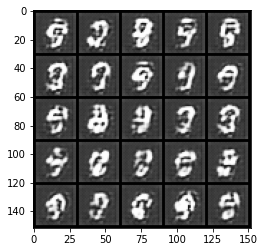

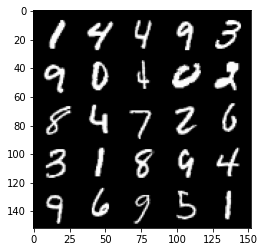

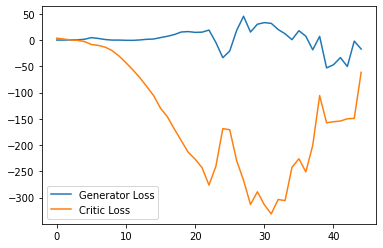

Step 950: Generator loss: -52.04351504802704, critic loss: -110.2596810760498


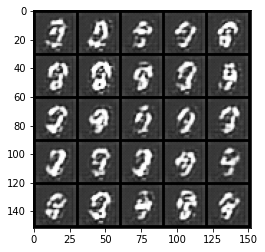

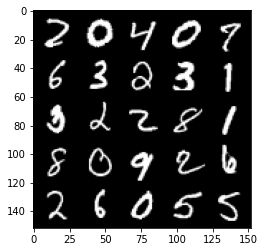

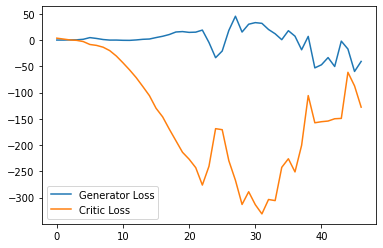

Step 1000: Generator loss: -39.88424353599548, critic loss: -84.87494160461425


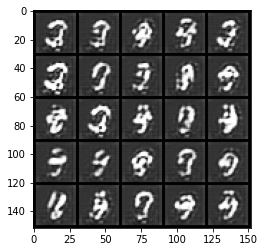

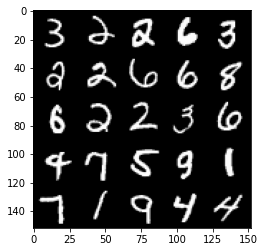

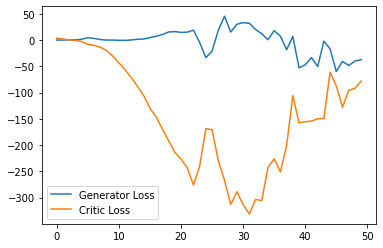

Step 1050: Generator loss: -16.32620949745178, critic loss: -40.05082010650634


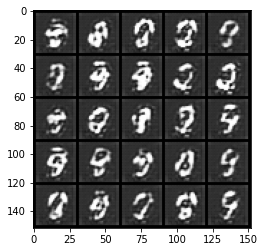

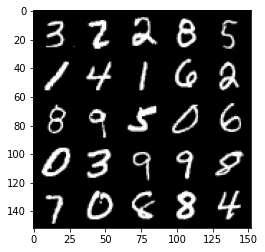

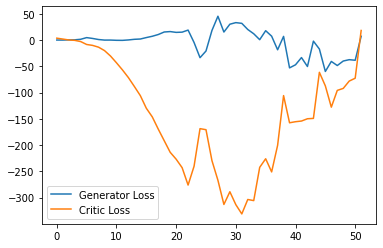

Step 1100: Generator loss: 0.6923063850402832, critic loss: 11.110803699493408


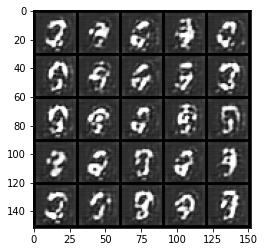

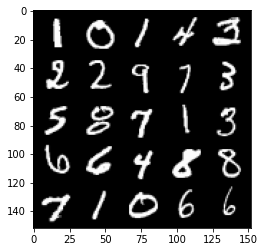

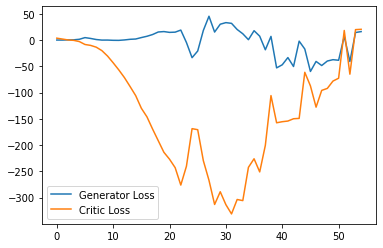

Step 1150: Generator loss: -0.8551503396034241, critic loss: -14.951314384460447


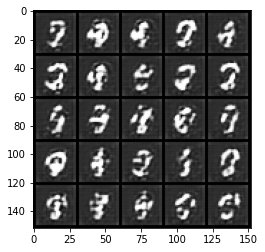

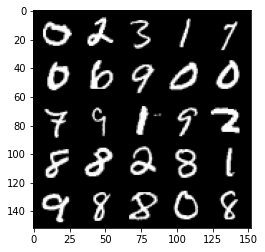

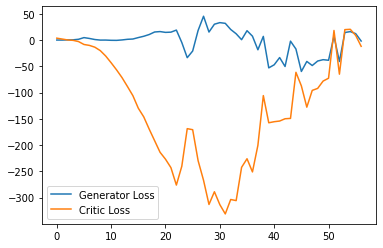

Step 1200: Generator loss: -23.893584564328194, critic loss: -40.97478426361086


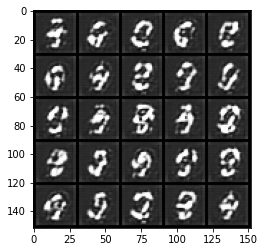

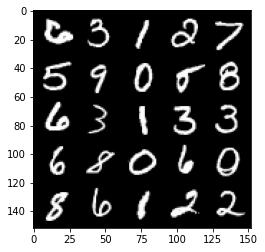

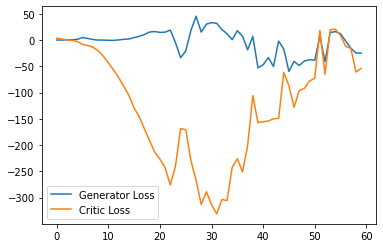

Step 1250: Generator loss: -11.31564863204956, critic loss: 21.316098487854003


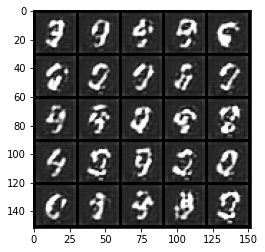

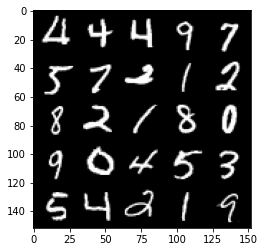

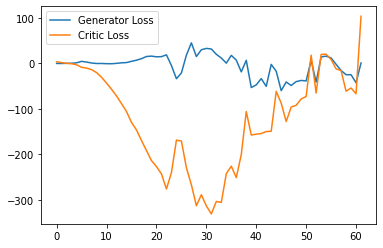

Step 1300: Generator loss: 14.519966926574707, critic loss: 55.1009631881714


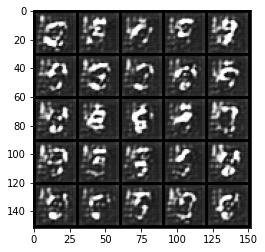

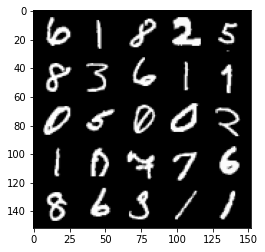

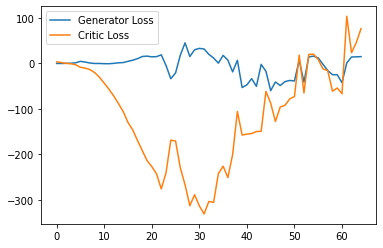

Step 1350: Generator loss: 14.39445095062256, critic loss: 93.41582548522948


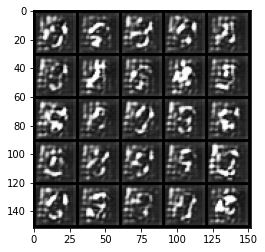

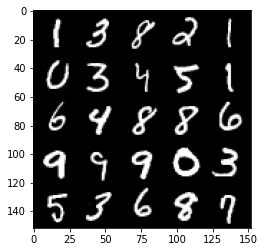

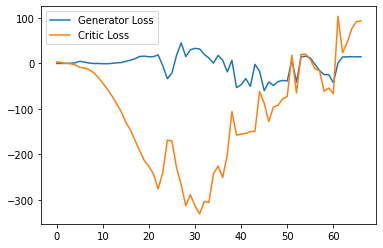

Step 1400: Generator loss: 12.896842727661133, critic loss: 85.85094770812988


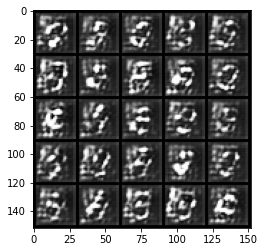

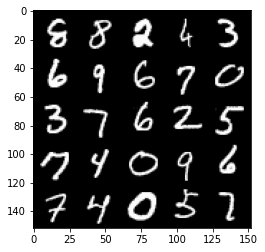

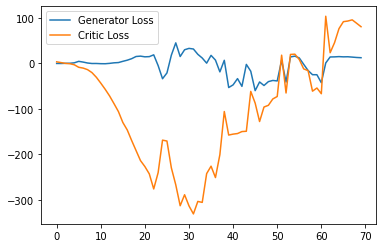

Step 1450: Generator loss: 12.08250617980957, critic loss: 56.32963759613037


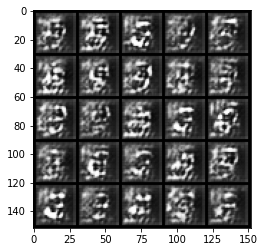

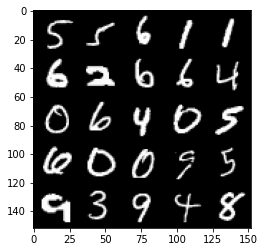

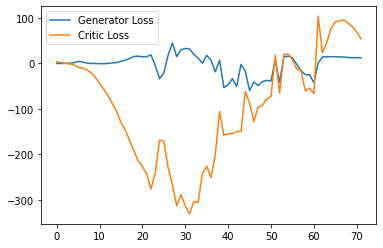

Step 1500: Generator loss: 6.995104718208313, critic loss: 7.268716415405273


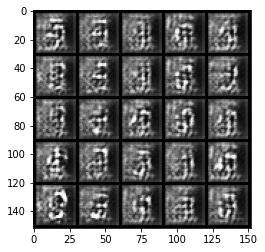

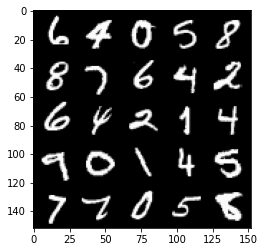

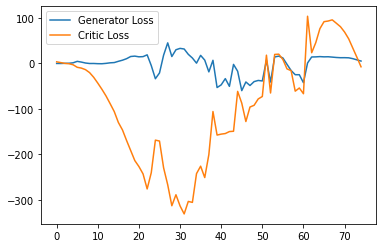

Step 1550: Generator loss: 2.046976274251938, critic loss: -28.797070526123044


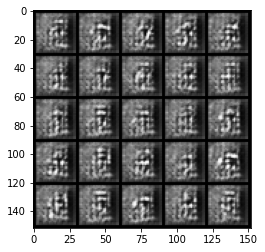

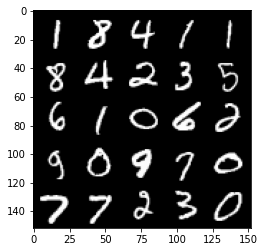

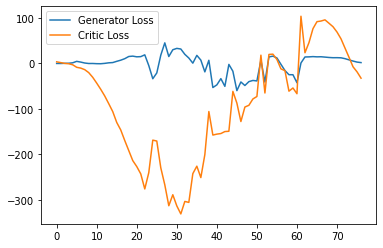

Step 1600: Generator loss: 0.8213768452778458, critic loss: -54.02820559692385


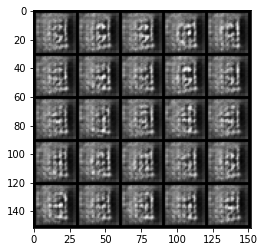

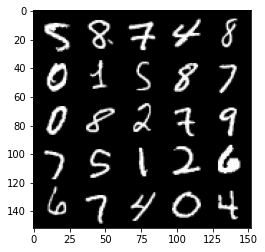

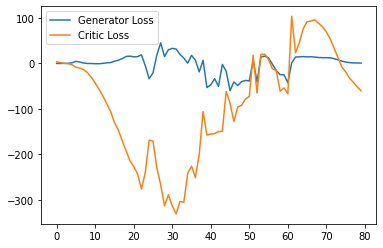

Step 1650: Generator loss: 0.1327375778928399, critic loss: -81.27280815124512


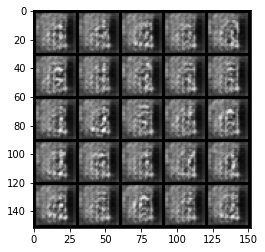

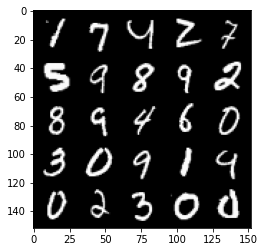

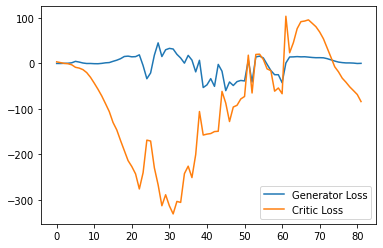

Step 1700: Generator loss: 2.278608479499817, critic loss: -117.18781799316407


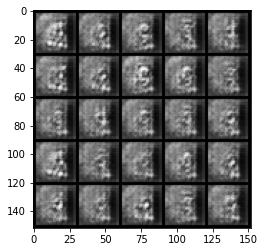

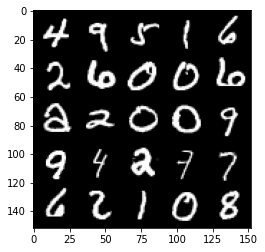

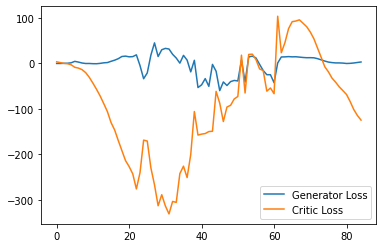

Step 1750: Generator loss: 3.704960412979126, critic loss: -142.6707264099121


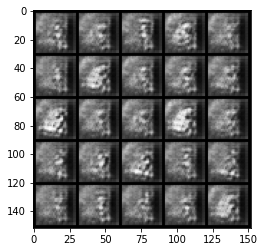

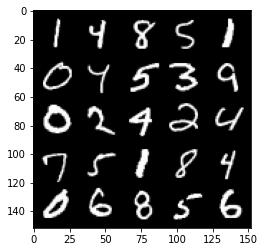

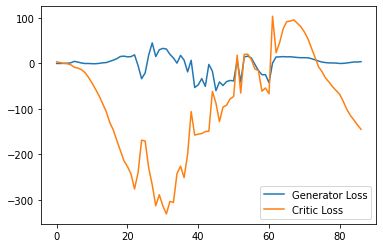

Step 1800: Generator loss: 5.82713623046875, critic loss: -158.2834863586426


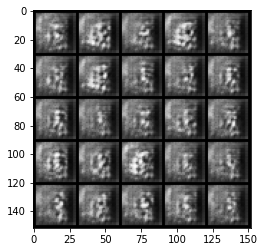

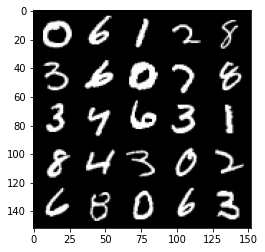

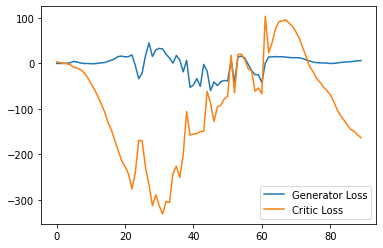

Step 1850: Generator loss: 7.1852551937103275, critic loss: -172.04509844970707


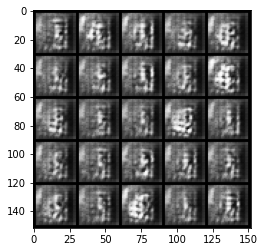

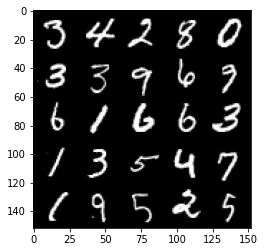

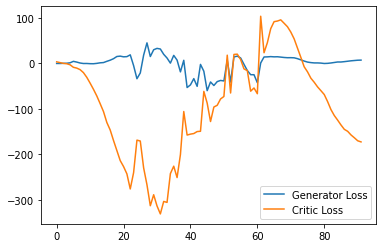

Step 1900: Generator loss: 5.740432715415954, critic loss: -167.24778793334957


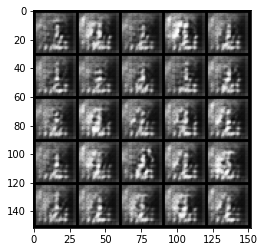

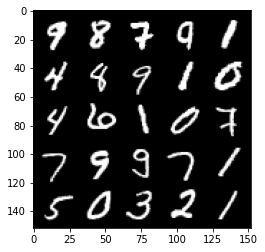

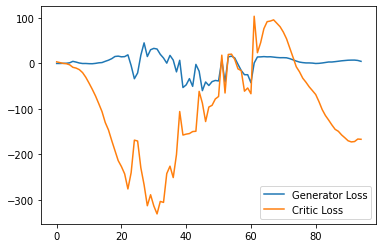

Step 1950: Generator loss: 2.3917030829191206, critic loss: -167.7452085571289


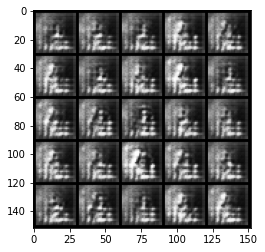

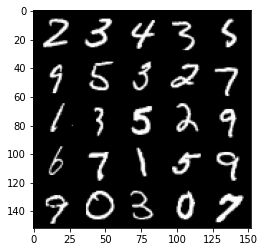

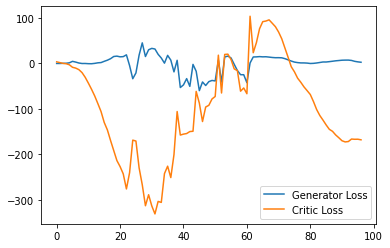

Step 2000: Generator loss: -3.915582554936409, critic loss: -153.15189065551758


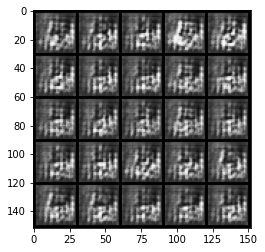

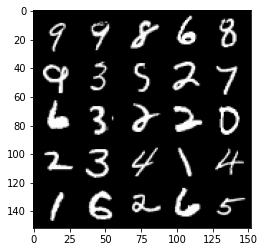

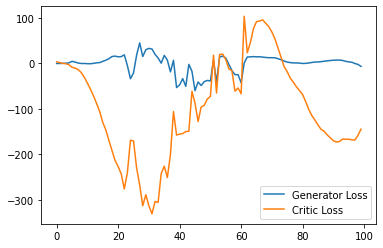

Step 2050: Generator loss: -0.8590501397848129, critic loss: -23.49707422637939


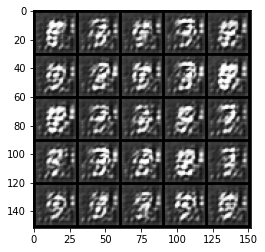

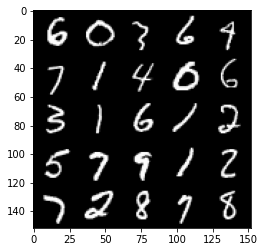

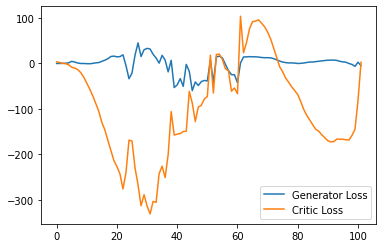

Step 2100: Generator loss: -6.88113397359848, critic loss: 2.5172652053833007


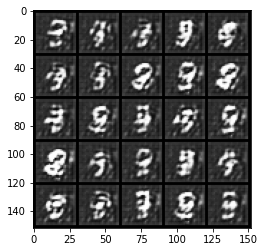

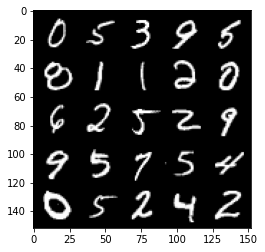

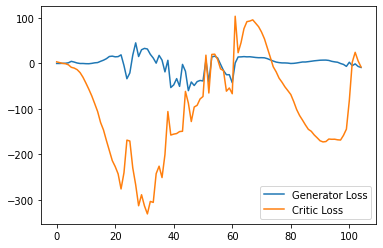

Step 2150: Generator loss: -11.682073680609465, critic loss: -10.756893981933594


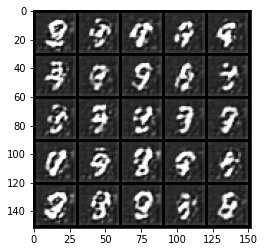

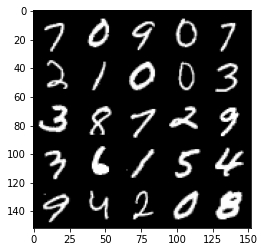

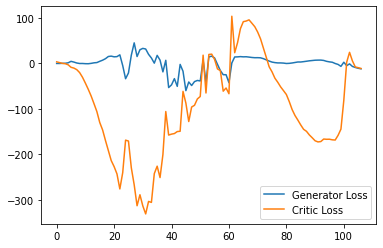

Step 2200: Generator loss: -7.867876119613648, critic loss: -14.088413711547851


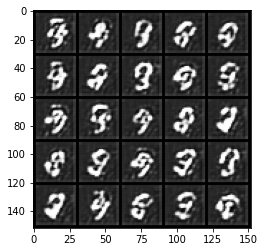

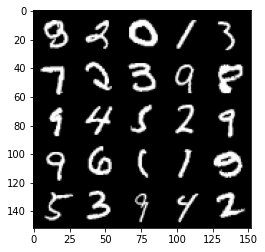

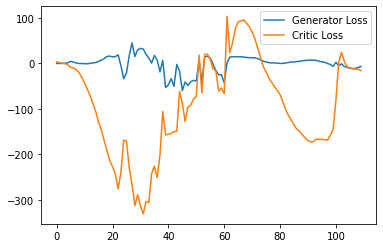

Step 2250: Generator loss: -5.985676594078541, critic loss: -14.906864479064941


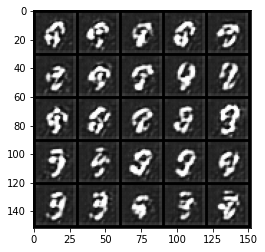

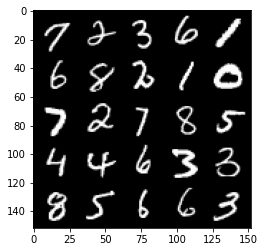

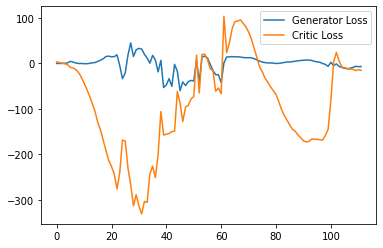

Step 2300: Generator loss: -2.8374881534278393, critic loss: -15.310830455780033


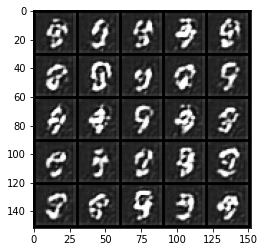

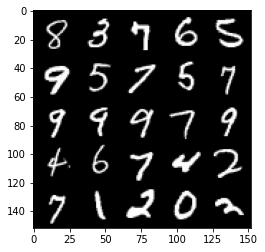

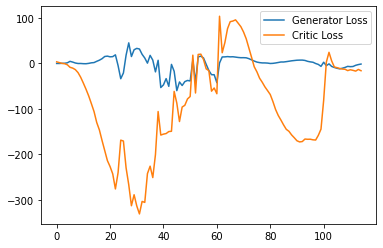

Step 2350: Generator loss: 0.38287710905075073, critic loss: -15.204487728118897


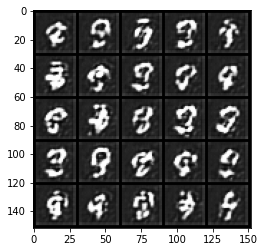

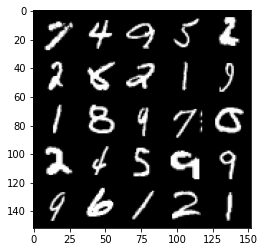

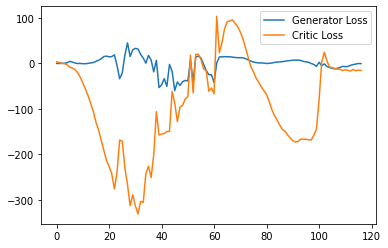

Step 2400: Generator loss: 1.9605383762717248, critic loss: -14.730918621063235


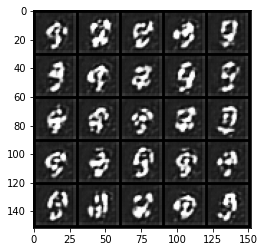

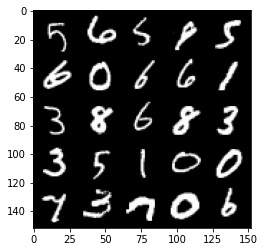

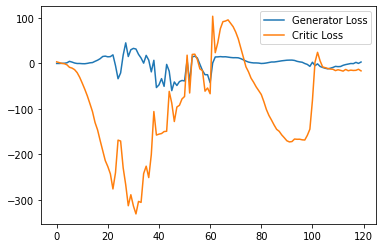

Step 2450: Generator loss: 1.4332077890634536, critic loss: -17.543065677642822


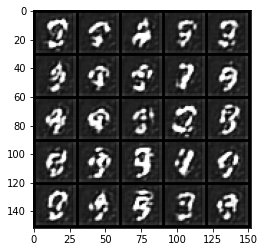

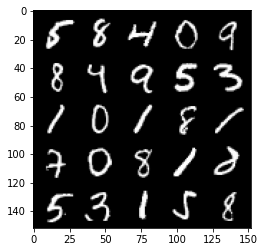

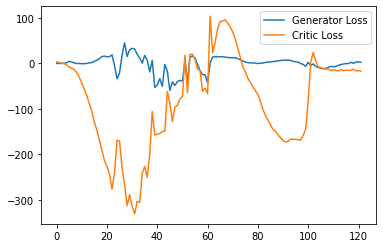

Step 2500: Generator loss: 3.705079907476902, critic loss: -17.692045047760008


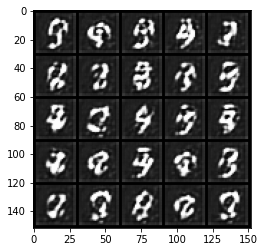

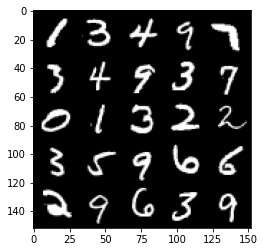

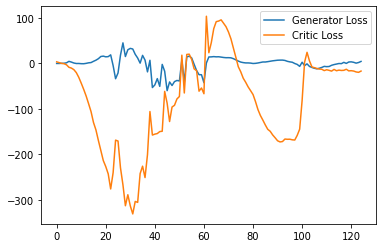

Step 2550: Generator loss: 5.6189897376298905, critic loss: -18.067042457580563


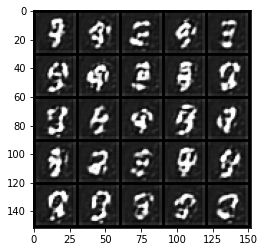

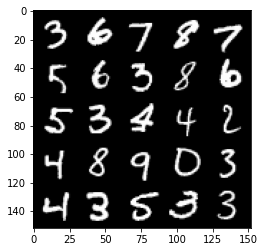

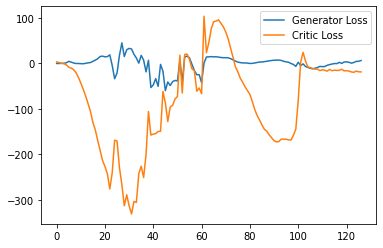

Step 2600: Generator loss: 4.9920409566164015, critic loss: -17.606637207031252


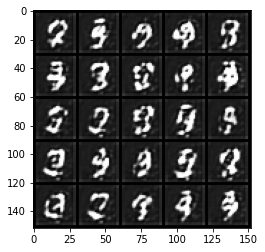

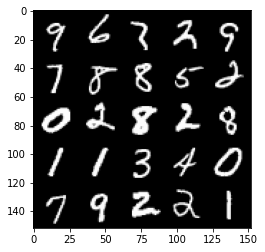

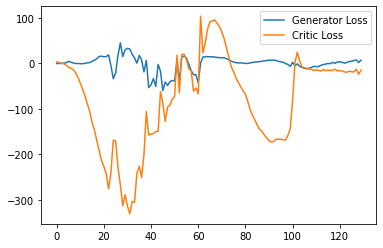

Step 2650: Generator loss: 4.6102074483037, critic loss: -20.06906358718872


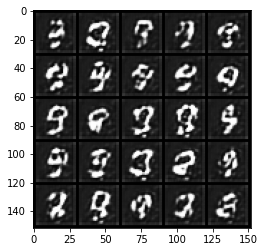

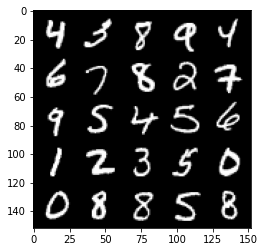

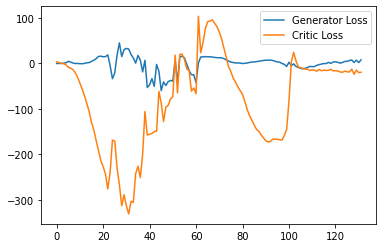

Step 2700: Generator loss: 8.314865656495094, critic loss: -14.242462062835692


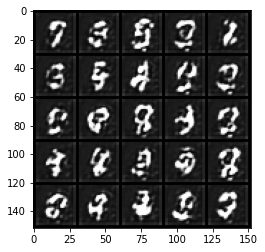

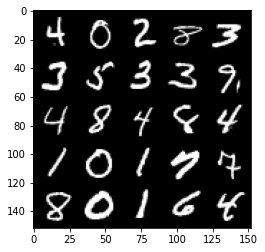

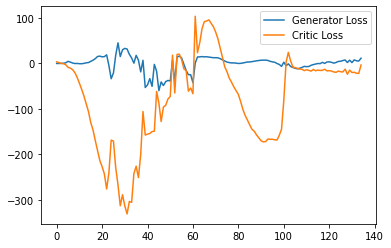

Step 2750: Generator loss: 15.849489898681641, critic loss: -4.009193921089173


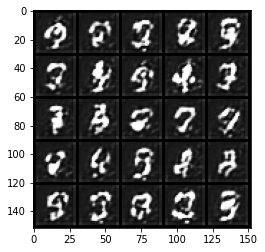

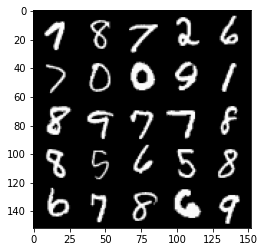

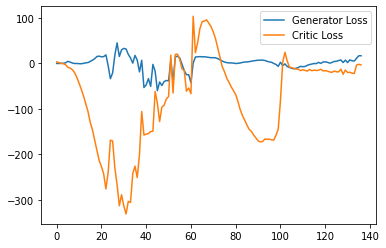

Step 2800: Generator loss: 9.003890323638917, critic loss: -18.580383054733275


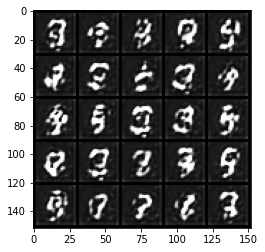

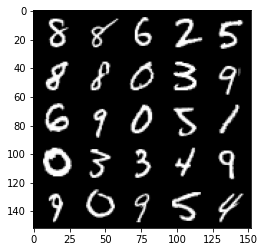

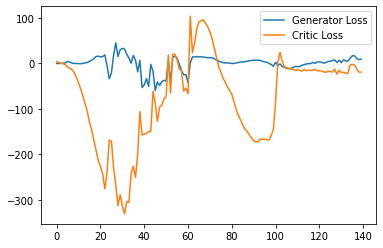

Step 2850: Generator loss: 12.503103861808777, critic loss: -20.557537326812746


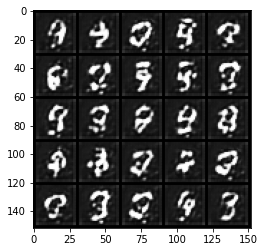

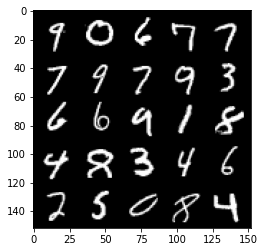

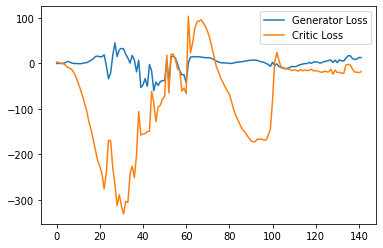

Step 2900: Generator loss: 14.91507299900055, critic loss: -21.450491802215574


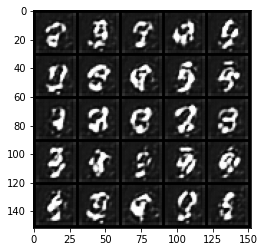

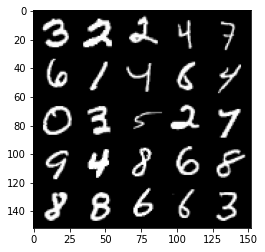

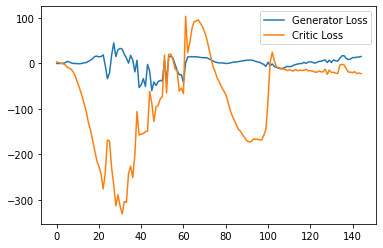

Step 2950: Generator loss: 16.09903168439865, critic loss: -19.69747700691223


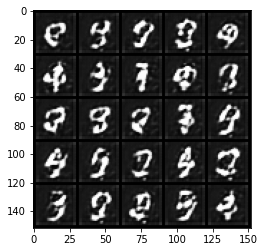

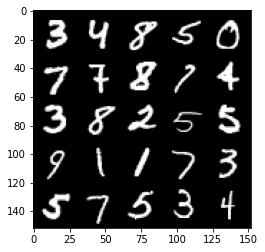

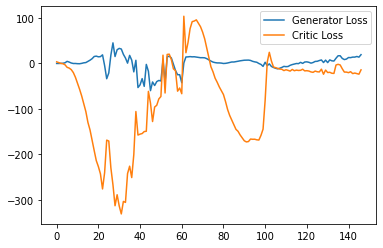

Step 3000: Generator loss: 16.856595537662507, critic loss: -18.728646205902102


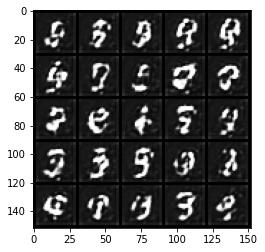

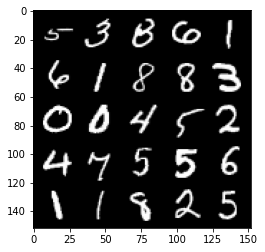

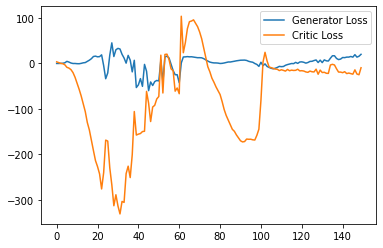

Step 3050: Generator loss: 17.722638778686523, critic loss: -15.552807570457455


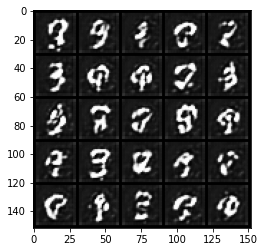

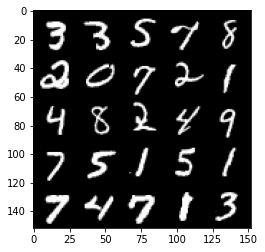

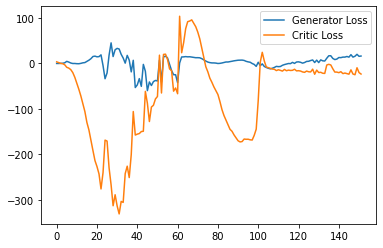

Step 3100: Generator loss: 27.524598274230957, critic loss: -9.170277915000916


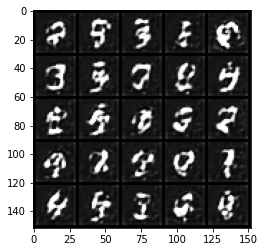

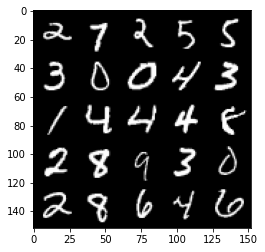

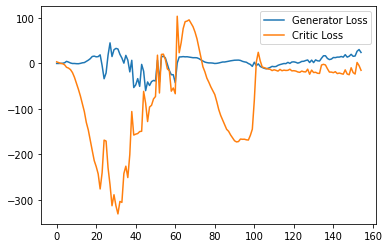

Step 3150: Generator loss: 17.986316528320312, critic loss: -25.018339298248293


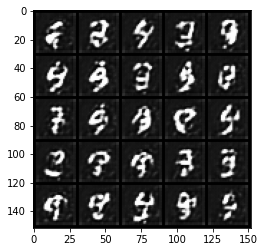

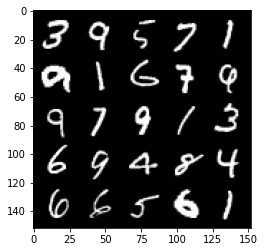

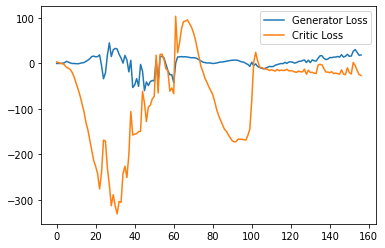

Step 3200: Generator loss: 21.785451583862304, critic loss: -22.971170243263238


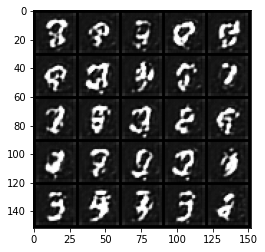

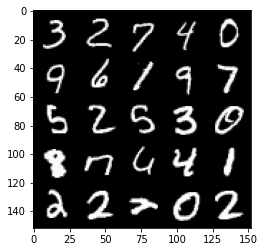

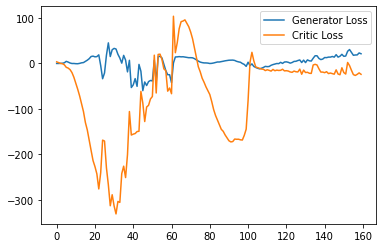

Step 3250: Generator loss: 21.1391881942749, critic loss: -24.689166419982918


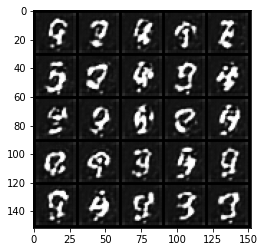

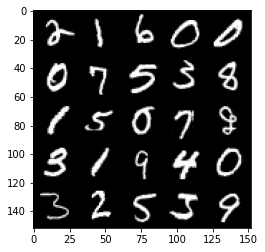

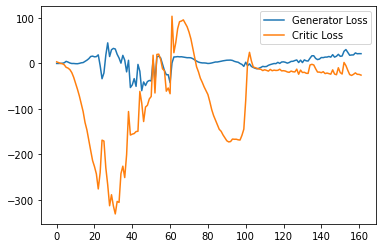

Step 3300: Generator loss: 32.000600566864016, critic loss: -3.69841462802887


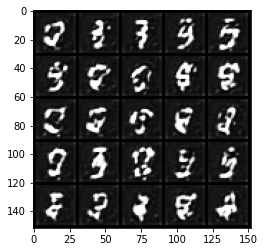

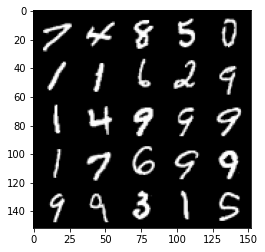

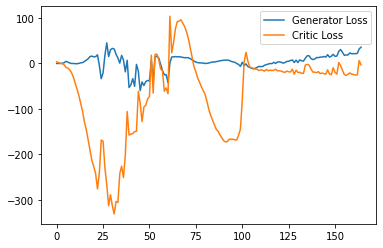

Step 3350: Generator loss: 34.63003944396973, critic loss: -3.4390238494873047


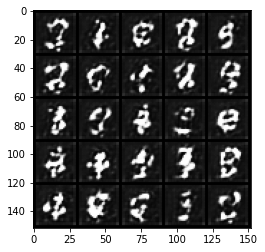

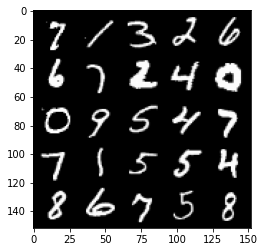

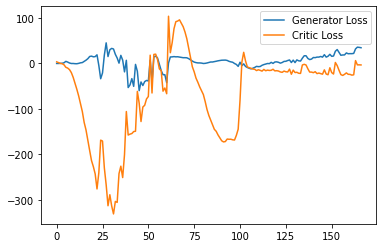

Step 3400: Generator loss: 32.048604583740236, critic loss: -7.1209378337860105


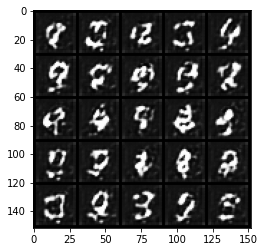

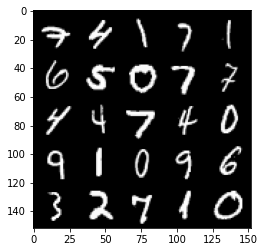

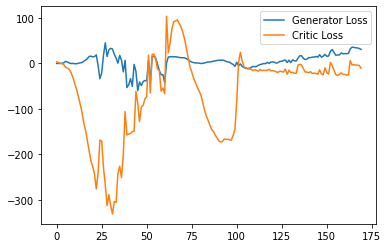

Step 3450: Generator loss: 24.996285209655763, critic loss: -21.16758546352386


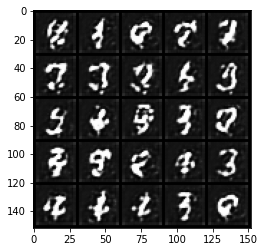

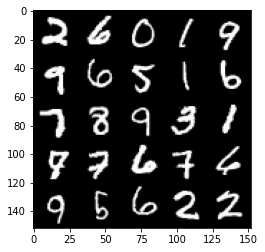

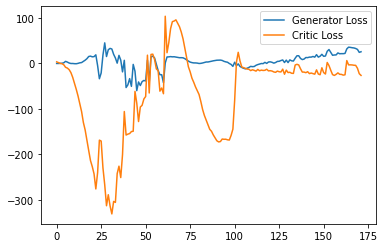

Step 3500: Generator loss: 39.77720596313477, critic loss: -3.5689439878463736


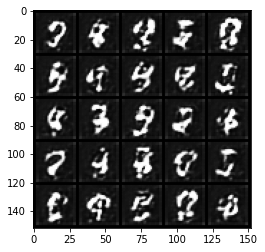

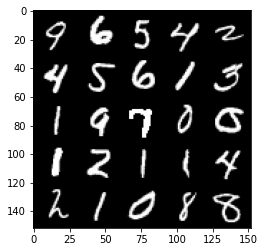

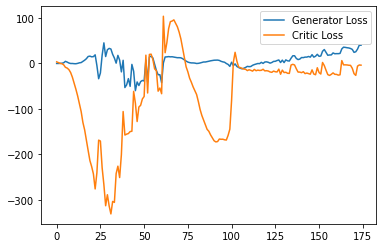

Step 3550: Generator loss: 32.84556949615479, critic loss: -15.153215505599976


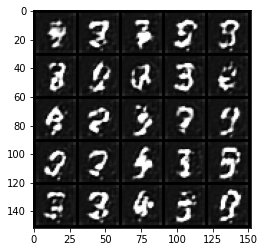

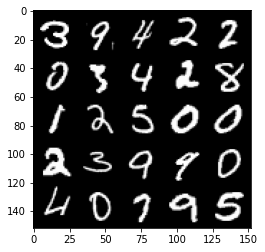

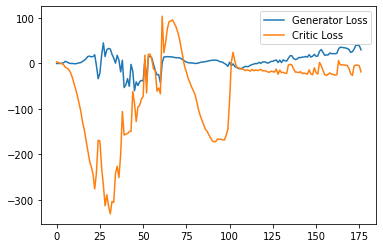

Step 3600: Generator loss: 29.380246887207033, critic loss: -25.603263273239133


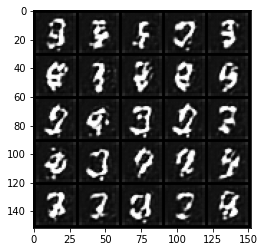

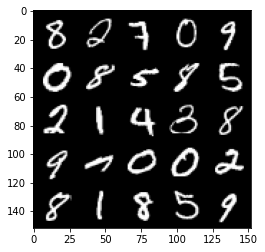

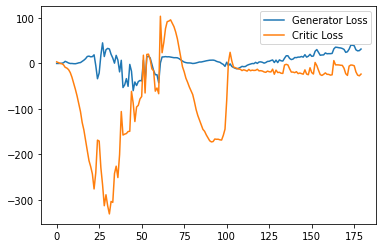

Step 3650: Generator loss: 35.2598518371582, critic loss: -21.18687333488465


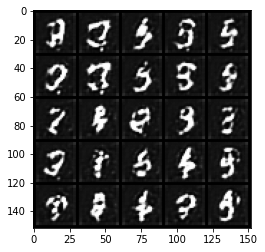

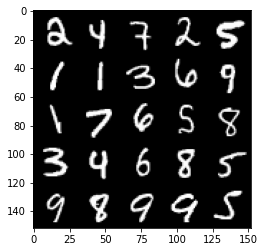

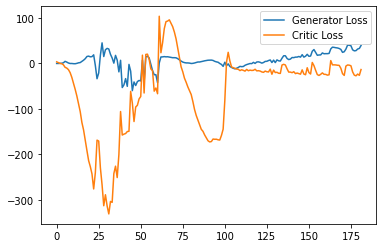

Step 3700: Generator loss: 35.1055167388916, critic loss: -22.56049683380127


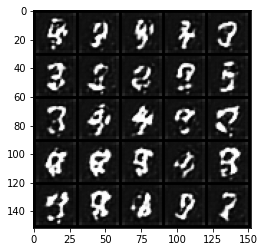

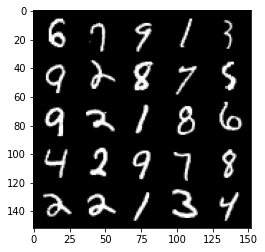

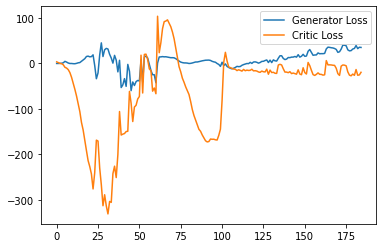

Step 3750: Generator loss: 39.031376419067385, critic loss: -18.79733493423462


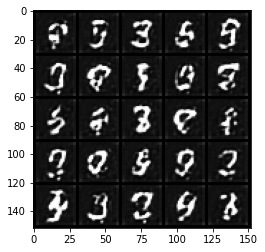

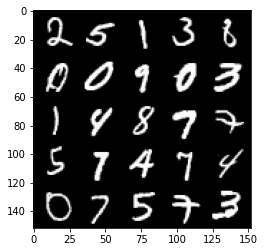

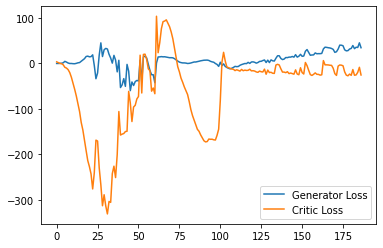

Step 3800: Generator loss: 41.60095043182373, critic loss: -15.96268893051148


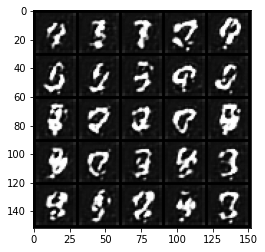

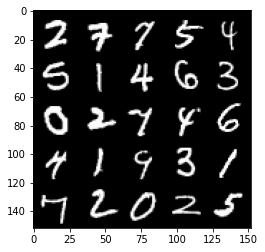

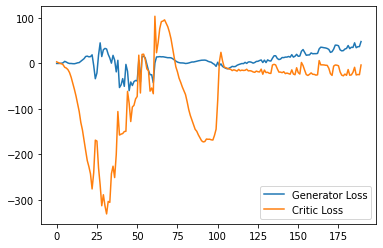

Step 3850: Generator loss: 44.94406150817871, critic loss: -18.44549943351745


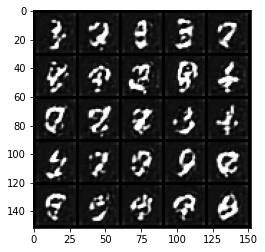

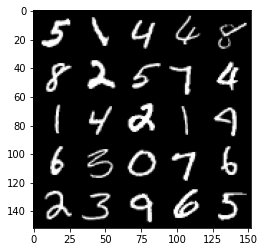

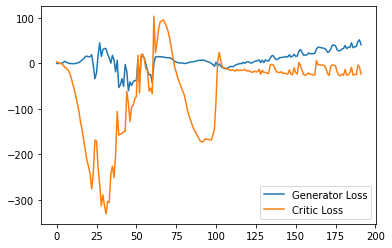

Step 3900: Generator loss: 43.43757568359375, critic loss: -23.947933632850646


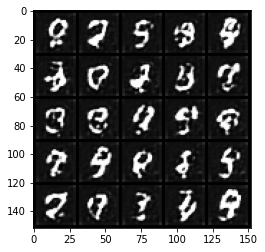

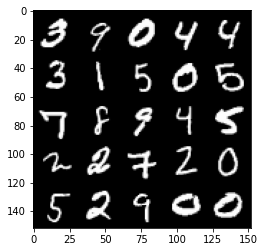

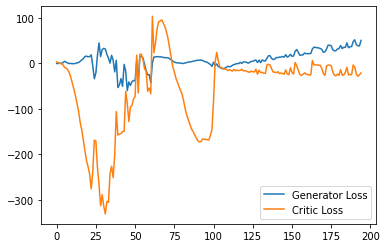

Step 3950: Generator loss: 45.29895871639252, critic loss: -19.73067095947265


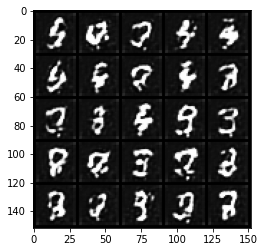

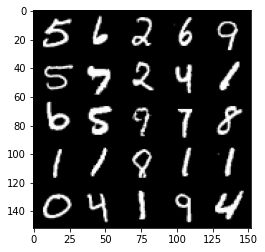

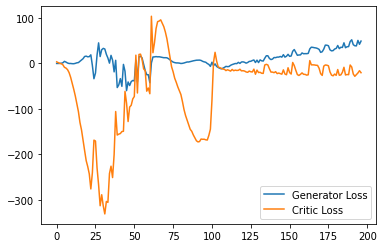

Step 4000: Generator loss: 44.09544975280762, critic loss: -26.46755325317383


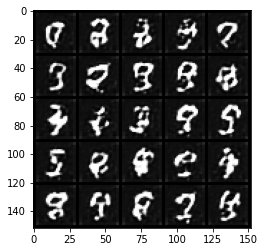

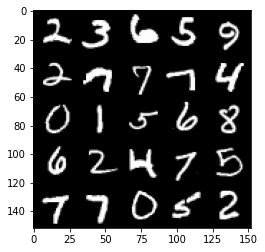

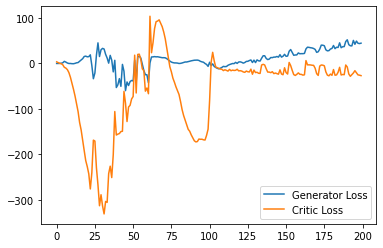

Step 4050: Generator loss: 54.262795486450194, critic loss: -14.198478005409243


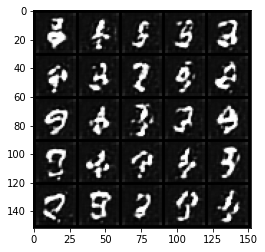

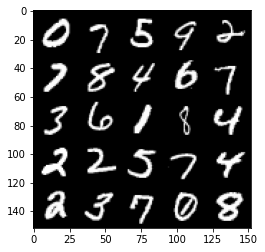

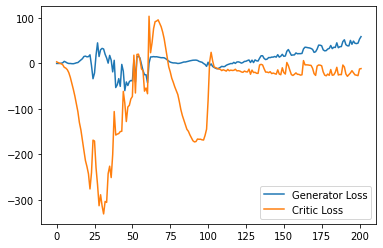

Step 4100: Generator loss: 45.999517364501955, critic loss: -25.665813642501824


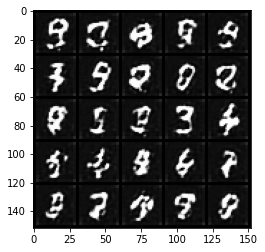

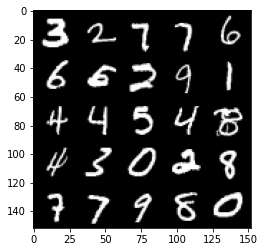

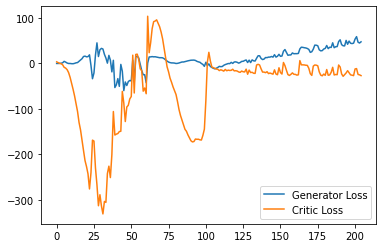

Step 4150: Generator loss: 49.390960159301756, critic loss: -25.92038662719727


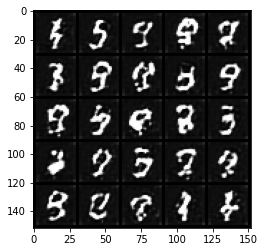

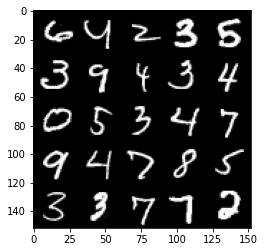

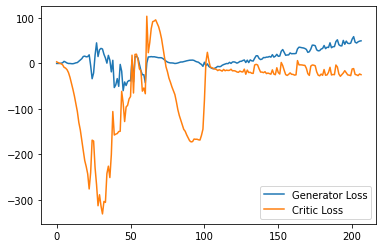

Step 4200: Generator loss: 52.127628860473635, critic loss: -21.95371962070466


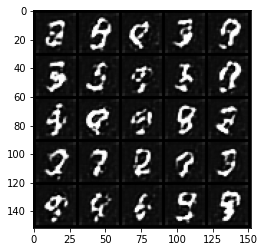

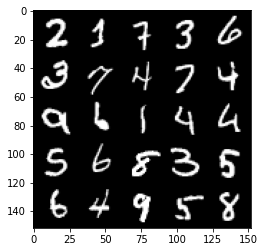

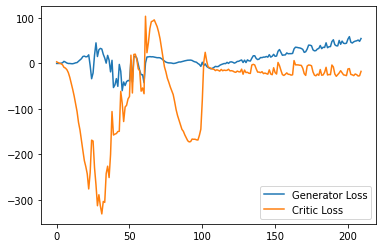

Step 4250: Generator loss: 53.20086647033691, critic loss: -24.434422407150265


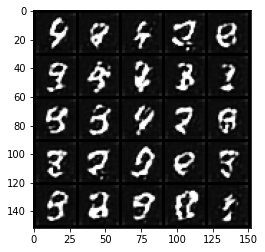

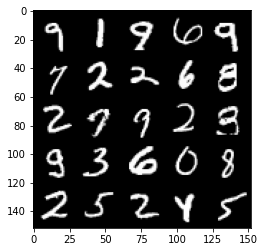

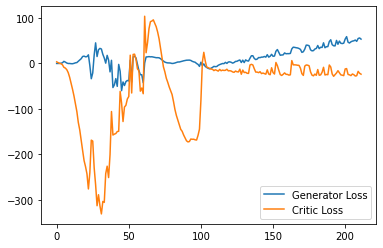

Step 4300: Generator loss: 53.12426414489746, critic loss: -25.981354015350338


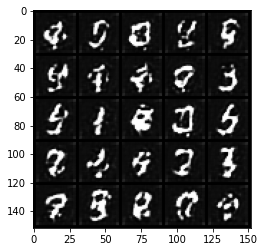

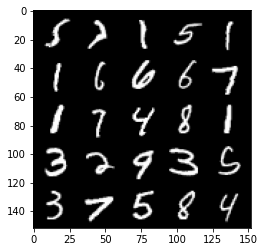

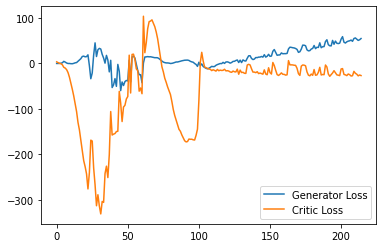

Step 4350: Generator loss: 55.30132297515869, critic loss: -23.818248246192933


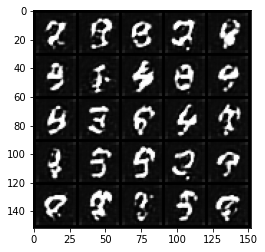

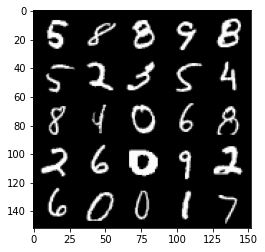

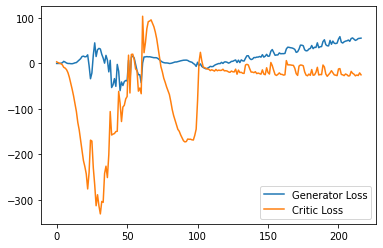

Step 4400: Generator loss: 63.89397323608399, critic loss: -9.840510501861573


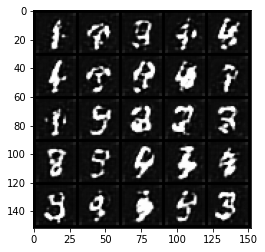

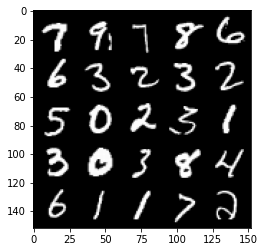

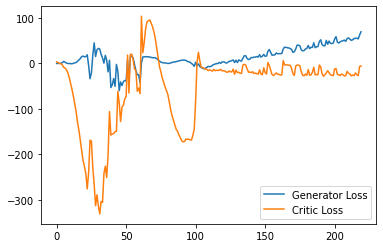

Step 4450: Generator loss: 65.99500389099121, critic loss: -7.964147000312806


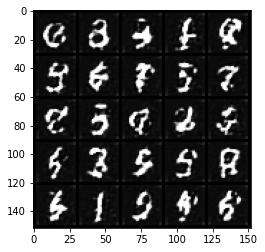

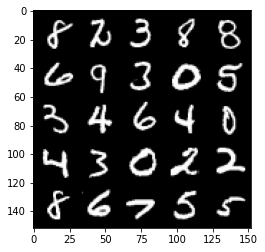

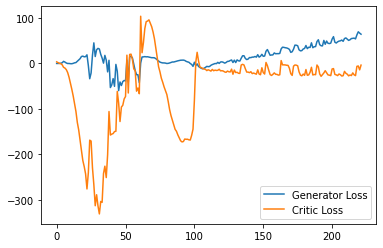

Step 4500: Generator loss: 61.18595581054687, critic loss: -15.92125965595245


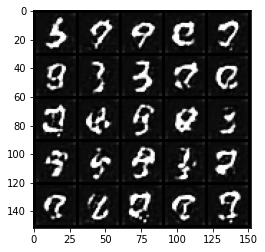

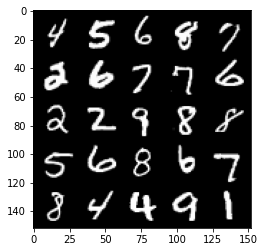

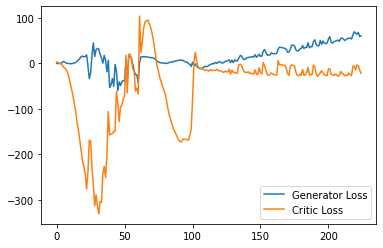

Step 4550: Generator loss: 57.42009033203125, critic loss: -27.933137329101555


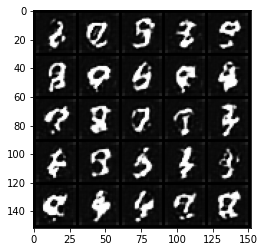

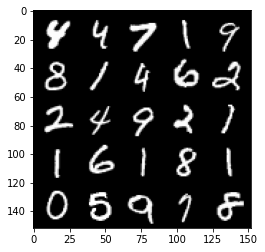

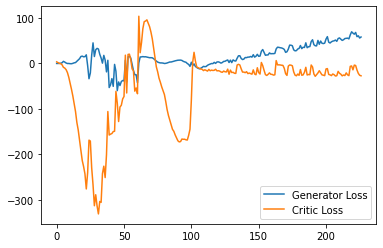

Step 4600: Generator loss: 59.356602630615235, critic loss: -23.277463470458983


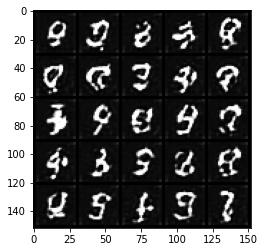

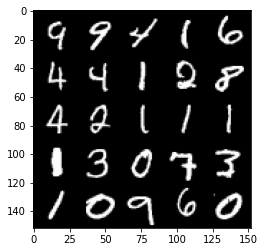

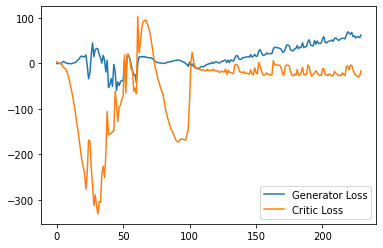

Step 4650: Generator loss: 61.42681282043457, critic loss: -23.830350340843207


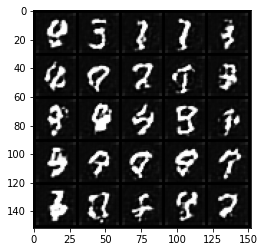

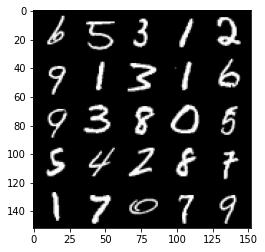

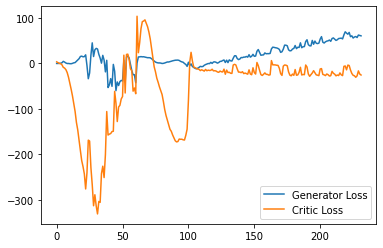

Step 4700: Generator loss: 65.26234161376954, critic loss: -21.28925631809235


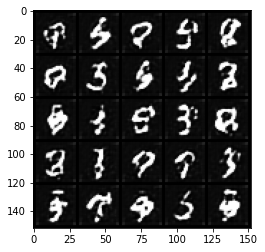

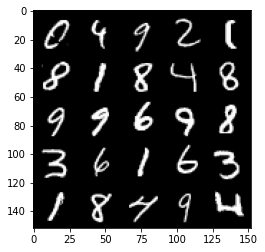

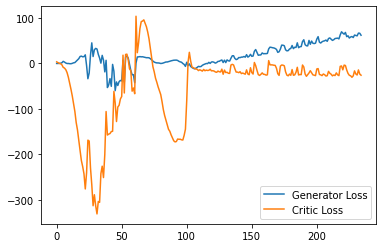

Step 4750: Generator loss: 63.77555992126465, critic loss: -26.817670761108406


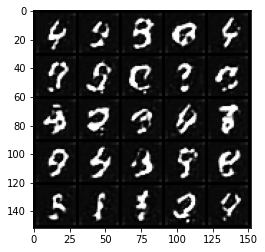

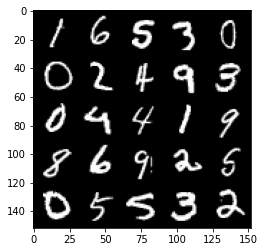

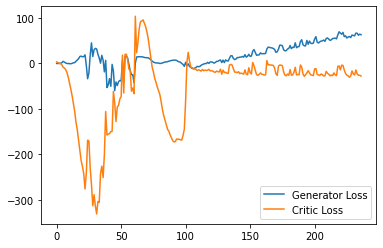

Step 4800: Generator loss: 77.9062882232666, critic loss: -6.745599989891052


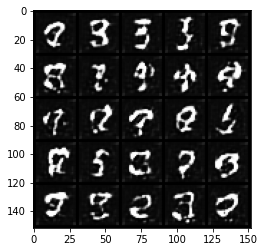

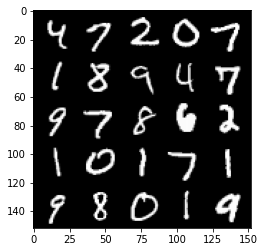

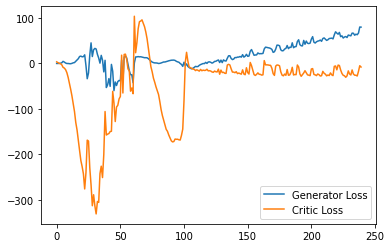

Step 4850: Generator loss: 75.98138839721679, critic loss: -5.223063879013061


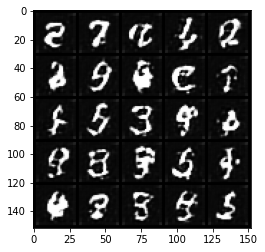

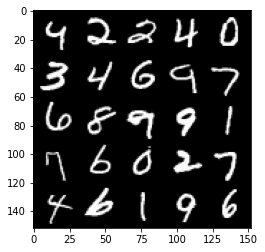

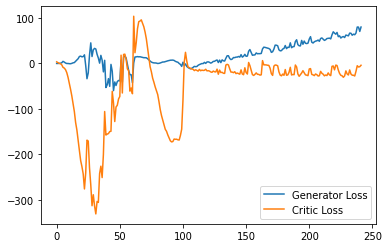

Step 4900: Generator loss: 67.90425819396972, critic loss: -17.157878314971928


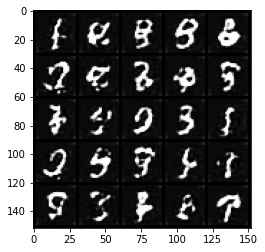

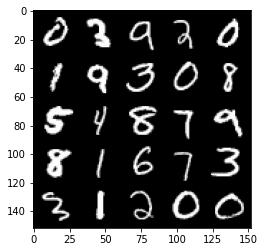

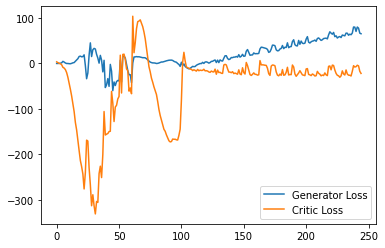

Step 4950: Generator loss: 70.21335914611817, critic loss: -23.75750224304199


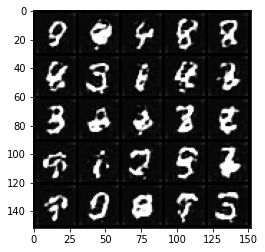

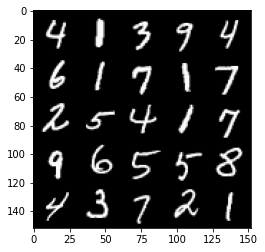

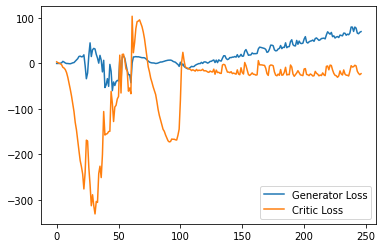

Step 5000: Generator loss: 73.68569198608398, critic loss: -22.062705883979792


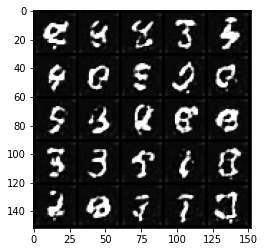

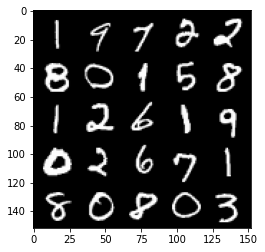

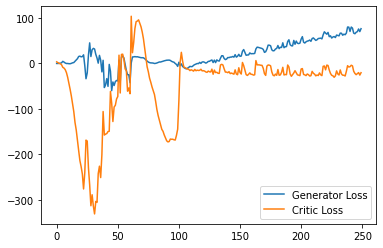

Step 5050: Generator loss: 80.29266792297364, critic loss: -0.3465245418548581


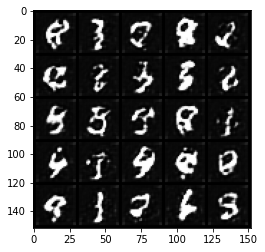

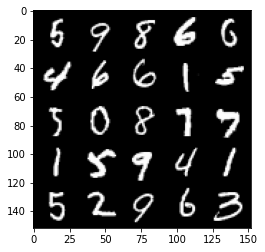

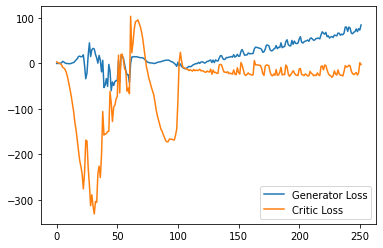

Step 5100: Generator loss: 82.2975373840332, critic loss: -2.700709199905396


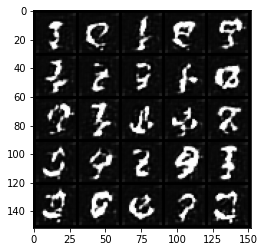

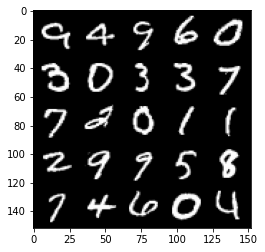

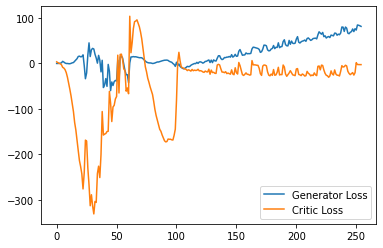

Step 5150: Generator loss: 79.84104248046874, critic loss: -2.9026299219131477


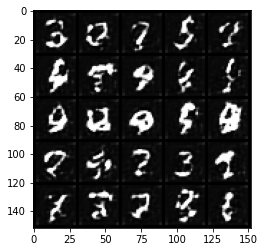

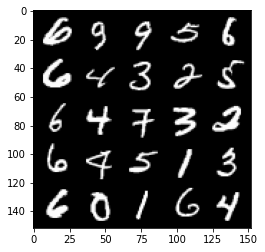

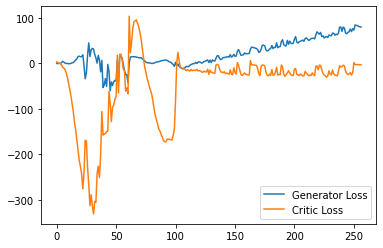

Step 5200: Generator loss: 78.41541183471679, critic loss: -3.171399417877197


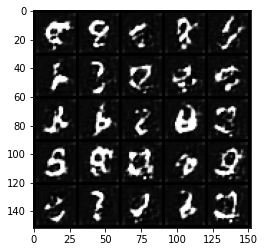

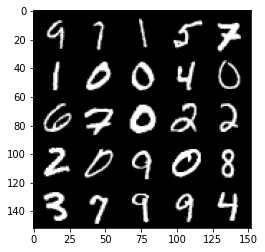

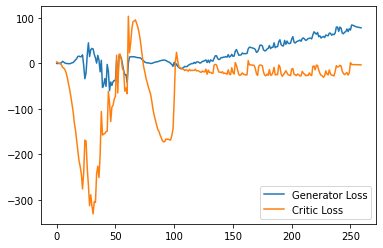

Step 5250: Generator loss: 77.32043655395508, critic loss: -3.5524102029800435


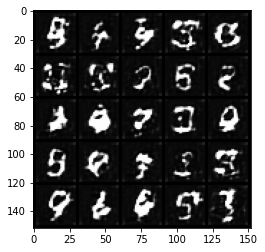

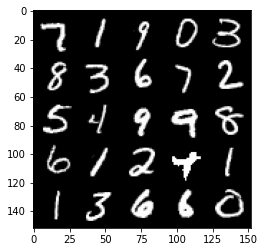

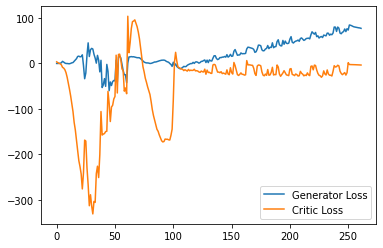

Step 5300: Generator loss: 75.95318832397462, critic loss: -4.07739108657837


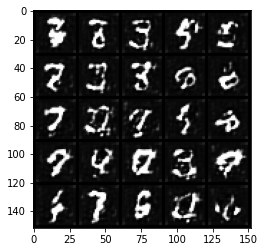

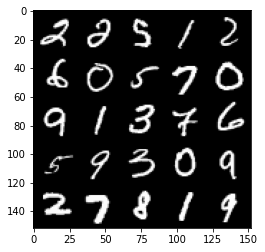

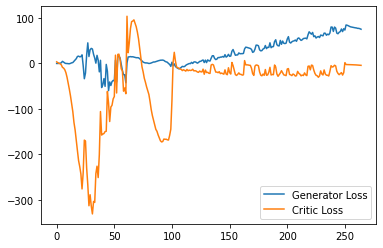

Step 5350: Generator loss: 70.57326866149903, critic loss: -15.505918687820435


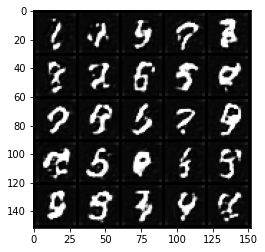

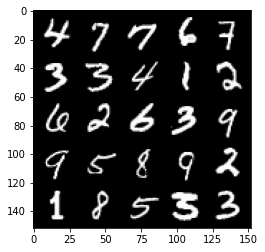

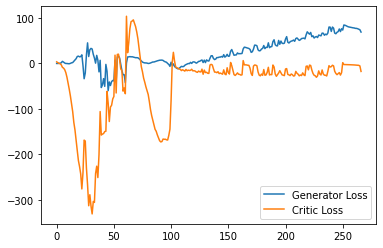

Step 5400: Generator loss: 67.45293098449707, critic loss: -21.320672677516935


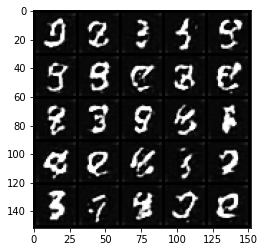

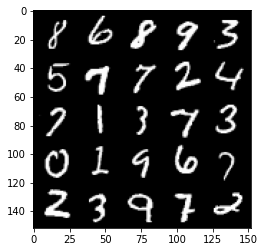

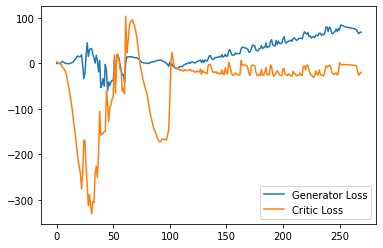

Step 5450: Generator loss: 77.72933670043945, critic loss: -15.333922837734214


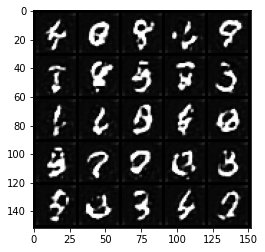

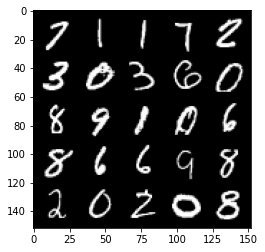

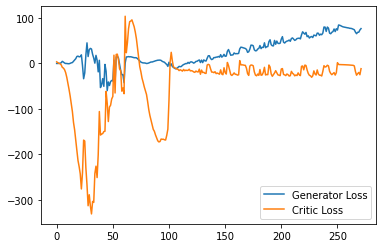

Step 5500: Generator loss: 79.24784446716309, critic loss: -14.047789851188663


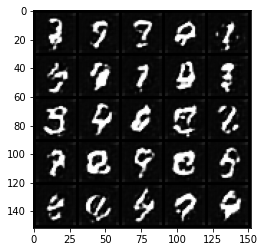

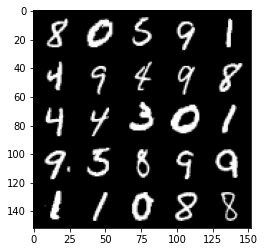

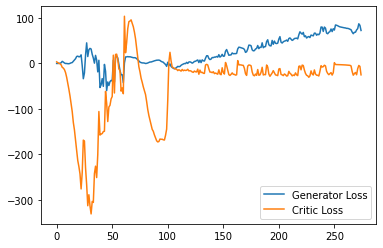

Step 5550: Generator loss: 73.18177825927734, critic loss: -23.28748598575591


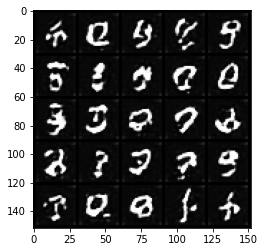

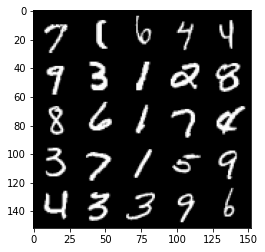

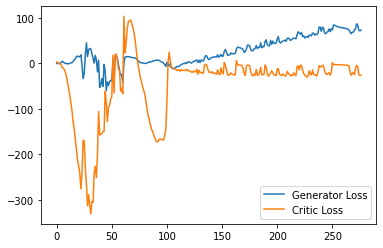

Step 5600: Generator loss: 76.97540122985839, critic loss: -21.797289241313933


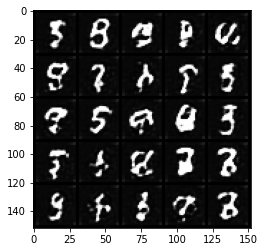

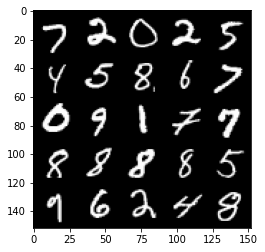

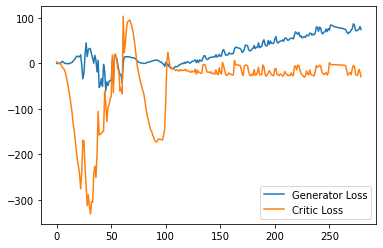

Step 5650: Generator loss: 77.92018630981445, critic loss: -24.939668401718144


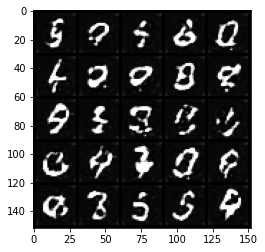

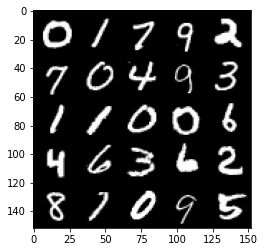

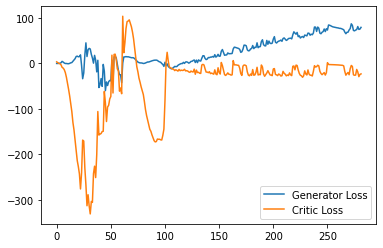

Step 5700: Generator loss: 75.34636688232422, critic loss: -27.954039916992187


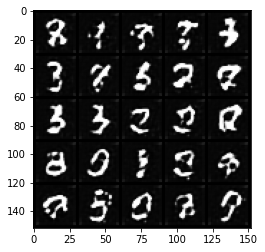

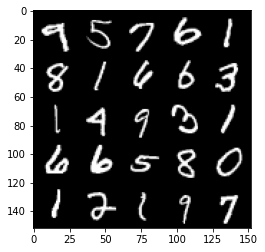

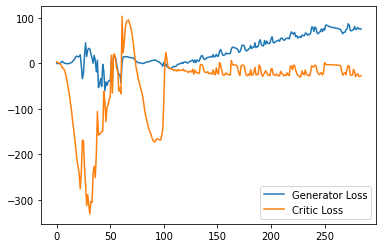

Step 5750: Generator loss: 76.36613044738769, critic loss: -23.974029970169067


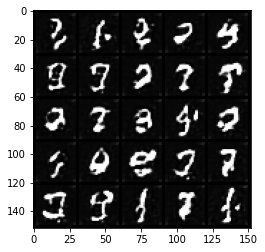

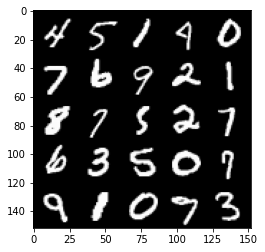

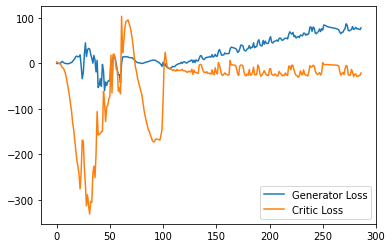

Step 5800: Generator loss: 78.91927749633788, critic loss: -28.221311315536504


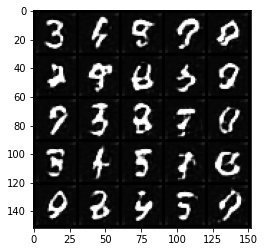

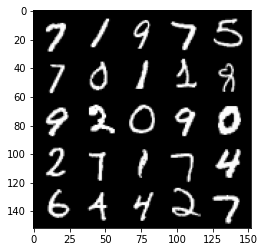

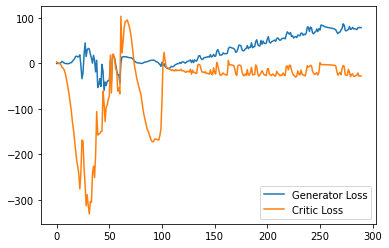

Step 5850: Generator loss: 83.09565856933594, critic loss: -25.995207793235767


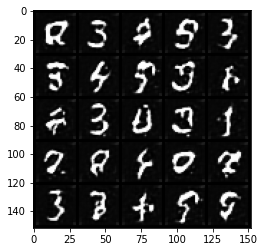

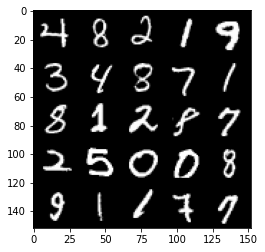

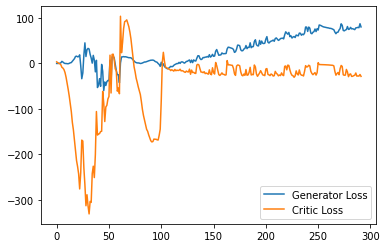

Step 5900: Generator loss: 84.1008576965332, critic loss: -23.662958500146864


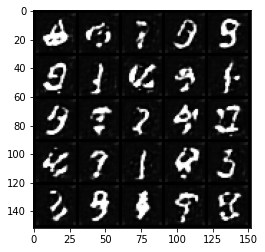

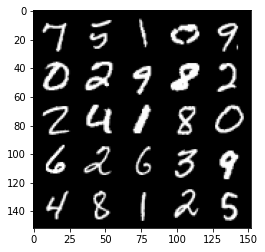

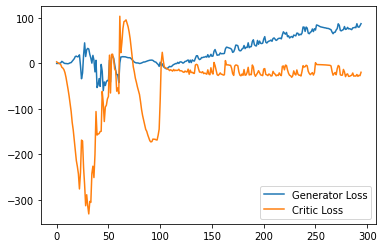

Step 5950: Generator loss: 85.54413864135742, critic loss: -24.582168488502504


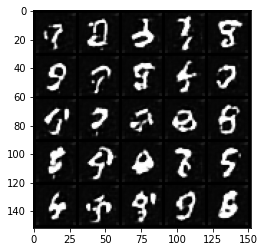

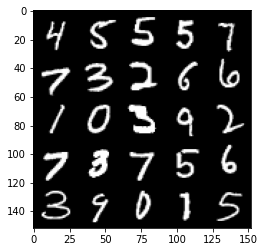

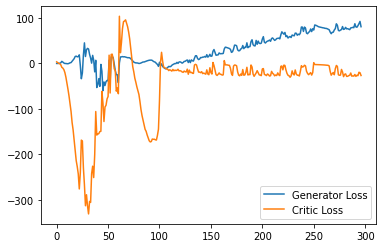

Step 6000: Generator loss: 95.57271133422852, critic loss: -0.574556962013244


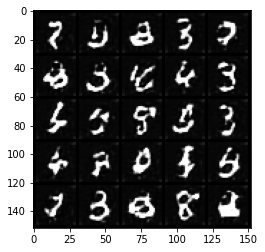

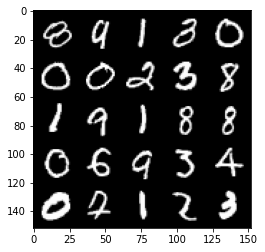

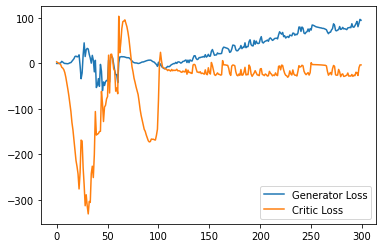

Step 6050: Generator loss: 89.7671696472168, critic loss: -7.3320215415954575


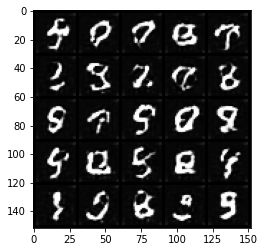

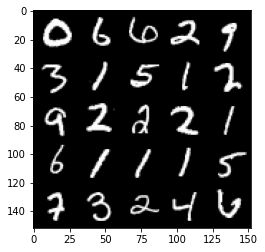

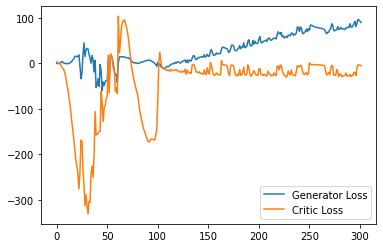

Step 6100: Generator loss: 81.68758804321288, critic loss: -24.423550947189334


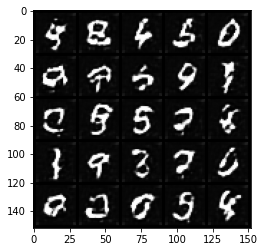

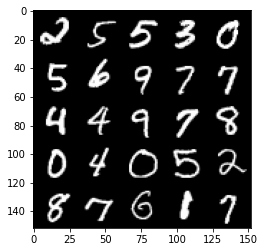

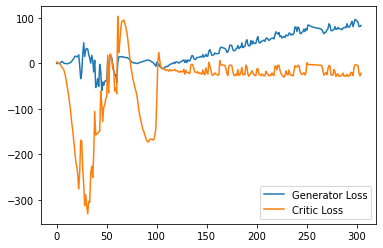

Step 6150: Generator loss: 84.89813766479492, critic loss: -29.002032480239873


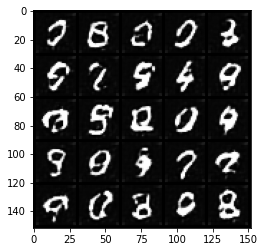

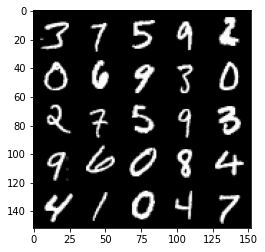

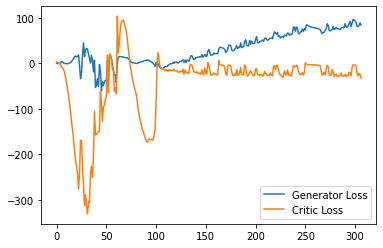

Step 6200: Generator loss: 87.30506866455079, critic loss: -27.676563583374033


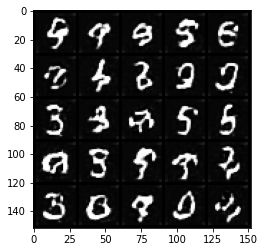

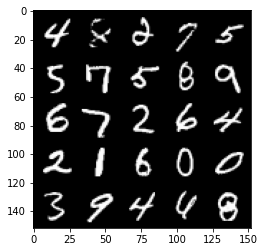

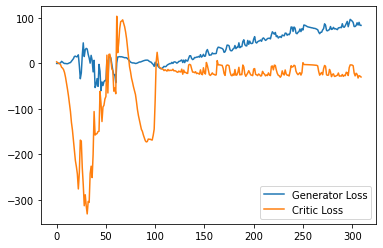

Step 6250: Generator loss: 87.5439582824707, critic loss: -20.840097073554993


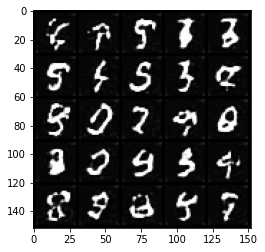

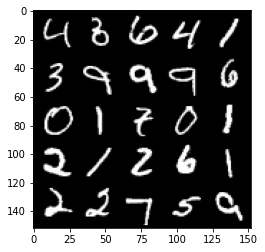

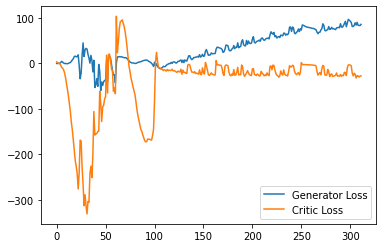

Step 6300: Generator loss: 88.69335540771485, critic loss: -23.871521106243137


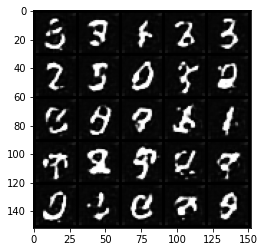

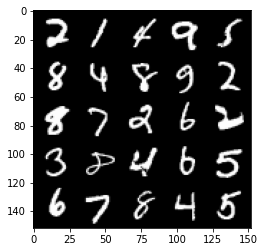

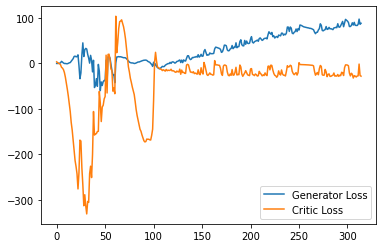

Step 6350: Generator loss: 89.09961059570313, critic loss: -27.655385714530947


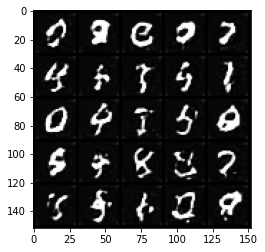

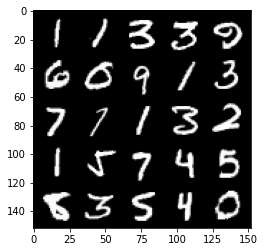

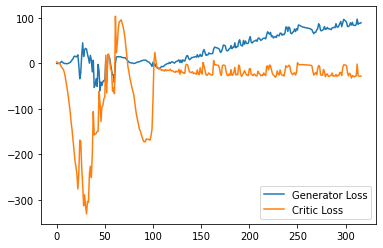

Step 6400: Generator loss: 91.71034729003907, critic loss: -24.773026897430412


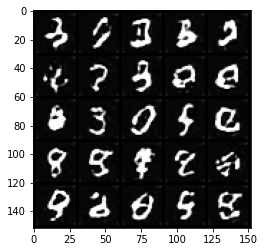

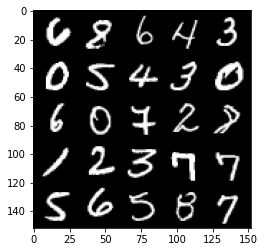

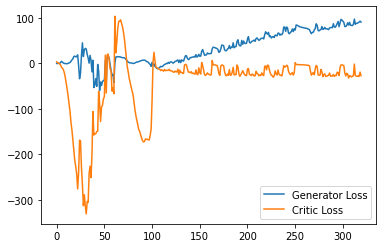

Step 6450: Generator loss: 92.35471511840821, critic loss: -20.179916287422174


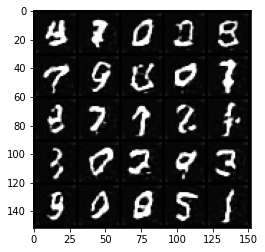

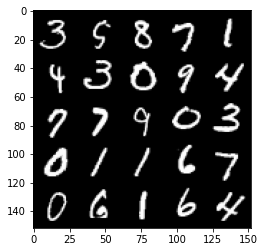

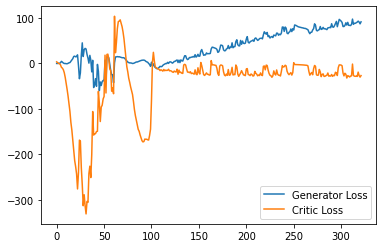

Step 6500: Generator loss: 103.53565002441407, critic loss: -4.4774620304107655


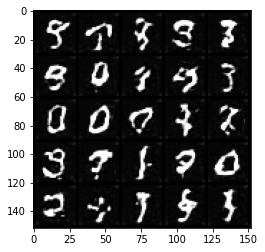

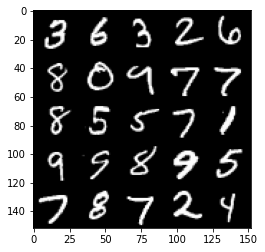

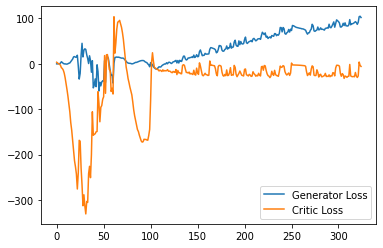

Step 6550: Generator loss: 95.26860656738282, critic loss: -21.400033218383793


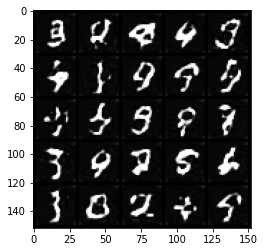

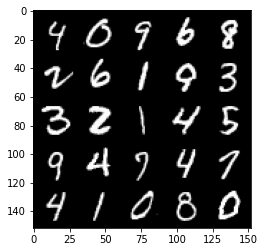

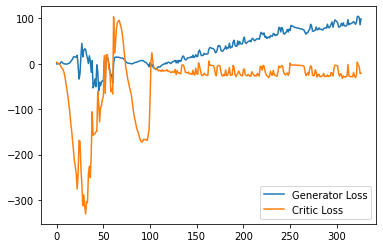

Step 6600: Generator loss: 92.2379217529297, critic loss: -28.79799799919129


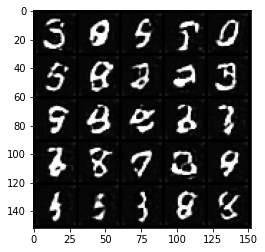

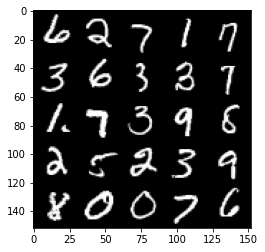

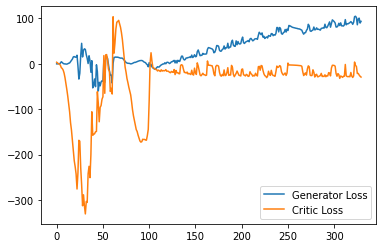

KeyboardInterrupt: 

In [18]:
import matplotlib.pyplot as plt

cur_step = 0
generator_losses = []
critic_losses = []
for epoch in range(n_epochs):
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)
        real = real.to(device)

        mean_iteration_critic_loss = 0
        for _ in range(crit_repeats):
            ### Update critic ###
            crit_opt.zero_grad()
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            crit_fake_pred = crit(fake.detach())
            crit_real_pred = crit(real)

            epsilon = torch.rand(len(real), 1, 1, 1, device=device, requires_grad=True)
            gradient = get_gradient(crit, real, fake.detach(), epsilon)
            gp = gradient_penalty(gradient)
            crit_loss = get_crit_loss(crit_fake_pred, crit_real_pred, gp, c_lambda)

            # Keep track of the average critic loss in this batch
            mean_iteration_critic_loss += crit_loss.item() / crit_repeats
            # Update gradients
            crit_loss.backward(retain_graph=True)
            # Update optimizer
            crit_opt.step()
        critic_losses += [mean_iteration_critic_loss]

        ### Update generator ###
        gen_opt.zero_grad()
        fake_noise_2 = get_noise(cur_batch_size, z_dim, device=device)
        fake_2 = gen(fake_noise_2)
        crit_fake_pred = crit(fake_2)
        
        gen_loss = get_gen_loss(crit_fake_pred)
        gen_loss.backward()

        # Update the weights
        gen_opt.step()

        # Keep track of the average generator loss
        generator_losses += [gen_loss.item()]

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            gen_mean = sum(generator_losses[-display_step:]) / display_step
            crit_mean = sum(critic_losses[-display_step:]) / display_step
            print(f"Step {cur_step}: Generator loss: {gen_mean}, critic loss: {crit_mean}")
            show_tensor_images(fake)
            show_tensor_images(real)
            step_bins = 20
            num_examples = (len(generator_losses) // step_bins) * step_bins
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(generator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Generator Loss"
            )
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(critic_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Critic Loss"
            )
            plt.legend()
            plt.show()

        cur_step += 1
